## **PROBLEM STATEMENT:-**

This case is about a bank (Magadha Bank) whose management wants to explore ways of converting its liability customers to personal loan customers (while retaining them as depositors). A campaign that the bank ran last year for liability customers showed a healthy conversion rate of over 9% success. This has encouraged the retail marketing department to devise campaigns with better target marketing to increase the success ratio with a minimal budget.

## **ABOUT THE DATASET:-**

the data about personal loan has been reviewed, which includes the following information:


1) **ID**: Customer ID
2) **Age**: Customer's age in completed years
3) **Experience**: Years of professional experience
4) **Income**: Annual income of customer
5) **Zipcode**: Address zipcode
6) **Family**: Size of family of customer
7) **CCAvg**: Average spending on credit-card per month
8) **Education**: Educational level(1=Undergraduate,2=Graduate,3=Post-graduate)
9) **Mortgage**: Value of house mortgages if any
10) **Personal_Loan**: Did the customer accept the personal loan offered in the last campaign?
11) **Securities_account**: Does the customer have a securities account with the bank?
12) **CD_account**: Does the customer have a certificate of deposit account with the bank?
13) **Online**: Does the customer use internet banking facilities?
14) **CreditCard**: Does the customer use the credit card provided by the bank?

## **IMPORTING THE REQUIRED LIBRARIES:-**

In [100]:
import pyforest
import plotly.subplots as sp
import plotly.express as px
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings('ignore')

print("Project has been created with this version of Pandas: " ,pd. __version__," And with this version of Numpy: ",np. __version__)

<IPython.core.display.Javascript object>

Project has been created with this version of Pandas:  2.1.4  And with this version of Numpy:  1.26.4


## **IMPORTING THE DATA:-**

In [101]:
df=pd.read_csv("Bank_Personal_Loan_Modelling(1).csv")

In [102]:
df.rename(columns={'ZIP Code': 'ZIP_Code'}, inplace=True)
df.rename(columns={'Personal Loan': 'Personal_Loan'}, inplace=True)
df.rename(columns={'Securities Account': 'Securities_Account'}, inplace=True)
df.rename(columns={'CD Account': 'CD_Account'}, inplace=True)


In [103]:
##df.sample(n) shows n number of rows randomly and gives a better view of the dataset
df.sample(10)

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
1275,1276,27,2,92,95616,2,3/10,1,178,0,0,0,1,0
3669,3670,40,15,22,95616,2,1/40,2,0,0,0,0,1,1
3536,3537,50,24,112,94005,1,0/30,1,229,0,0,0,0,0
1247,1248,52,28,39,94606,2,0/80,1,0,0,0,0,1,0
3657,3658,52,26,104,94025,2,2/40,2,0,0,0,0,1,1
1268,1269,34,9,62,92677,3,2/30,1,0,0,0,0,0,0
3860,3861,31,6,64,92121,2,0/10,1,0,0,0,0,1,1
4183,4184,41,17,140,94542,1,3/50,1,342,0,0,0,0,0
2661,2662,66,41,145,90009,1,2/50,1,0,0,0,0,1,0
32,33,53,28,41,94801,2,0/60,3,193,0,0,0,0,0


In [104]:
df.shape

(5000, 14)

We are working with 5000 rows and 14 columns in this dataset. Now let us grab some information about the data-types of the variables used in the dataset.

In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ID                  5000 non-null   int64 
 1   Age                 5000 non-null   int64 
 2   Experience          5000 non-null   int64 
 3   Income              5000 non-null   int64 
 4   ZIP_Code            5000 non-null   int64 
 5   Family              5000 non-null   int64 
 6   CCAvg               5000 non-null   object
 7   Education           5000 non-null   int64 
 8   Mortgage            5000 non-null   int64 
 9   Personal_Loan       5000 non-null   int64 
 10  Securities_Account  5000 non-null   int64 
 11  CD_Account          5000 non-null   int64 
 12  Online              5000 non-null   int64 
 13  CreditCard          5000 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 547.0+ KB


In [106]:
##We need to change the datatypes of some of the variables.
df['ID']=df['ID'].astype('category')
df['Education']=df['Education'].astype('category')
df['Personal_Loan']=df['Personal_Loan'].astype('category')
df['Securities_Account']=df['Securities_Account'].astype('category')
df['CD_Account']=df['CD_Account'].astype('category')
df['Online']=df['Online'].astype('category')
df['CreditCard']=df['CreditCard'].astype('category')

In [107]:
##Rechecking the datatypes

df.dtypes

ID                    category
Age                      int64
Experience               int64
Income                   int64
ZIP_Code                 int64
Family                   int64
CCAvg                   object
Education             category
Mortgage                 int64
Personal_Loan         category
Securities_Account    category
CD_Account            category
Online                category
CreditCard            category
dtype: object

If we see the data in CCAvg column,it needs to be converted to per year as all other parameters are on annual basis

In [108]:
df['CCAvg']=df['CCAvg'].str.replace("/",".")

# per month converted to per year
df['CCAvg']=df['CCAvg'].astype(float)*12

df

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0


In [109]:
# Negative work experience is impossible, if negative numbers reported, it must be converted to positive   
df["Experience"]=abs(df["Experience"])
df

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0


In [110]:
# a column has been added that shows each person is in which decade of his/her life.

decade=[]
for i in df["Age"]:
    if 20<=i <30:
        decade.append("twenty")
    if 30<=i <40:
        decade.append("thirty")
    if 40<=i <50:
        decade.append("forty")
    if 50<=i <60:
        decade.append("fifty")
    if 60<=i <70:
        decade.append("sixty")


df0=pd.DataFrame(decade)
df['decade']=df0
df

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,decade
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0,twenty
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0,forty
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0,thirty
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0,thirty
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1,thirty
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0,twenty
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0,thirty
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0,sixty
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0,sixty


In [111]:
#checking for null values in the dataset

df.isnull().sum()

ID                    0
Age                   0
Experience            0
Income                0
ZIP_Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Personal_Loan         0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
decade                0
dtype: int64

There are no null values in the dataset

In [112]:
#Getting information about all the numerical variables

df.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,5000.0,45.338400,11.463166,23.0,35.0,45.0,55.0,67.0
Experience,5000.0,20.134600,11.415189,0.0,10.0,20.0,30.0,43.0
Income,5000.0,73.774200,46.033729,8.0,39.0,64.0,98.0,224.0
ZIP_Code,5000.0,93152.503000,2121.852197,9307.0,91911.0,93437.0,94608.0,96651.0
Family,5000.0,2.396400,1.147663,1.0,1.0,2.0,3.0,4.0
CCAvg,5000.0,23.255256,20.971908,0.0,8.4,18.0,30.0,120.0
Mortgage,5000.0,56.498800,101.713802,0.0,0.0,0.0,101.0,635.0


From the above chart, we can infer that:

1) The customer base of the bank has a minimum age of 23 years and a maximum age of 67 years. 50% of customers are below the age of 45 years.
2) Experience cannot be a negative value but here the minimum experience is negative.We need to take care of that.
3) 50% of customers have 3 members in their families.
4) There are some customers whose minimum average spending on credit card is zero i.e.,they donot use their credit card at all
5) Upto 50% customers donot have their houses mortgaged.

In [113]:
df.describe(include=['object', 'category']).T


,count,unique,top,freq
ID,5000,5000,1,1
Education,5000,3,1,2096
Personal_Loan,5000,2,0,4520
Securities_Account,5000,2,0,4478
CD_Account,5000,2,0,4698
Online,5000,2,1,2984
CreditCard,5000,2,0,3530
decade,5000,5,fifty,1334


From the above chart, we can infer that:

1) Zip code number 94720 is the most frequent code
2) Maximum customers have the education code 1 which is undergraduate
3) Maximum customers didn't accept the personal loan offered in the last campaign
4) Maximum customers do not have securities account with the bank
5) Maximum customers do not have certificate of deposit account with the bank
6) Maximum customers use the internet banking facility
7) Maximum customers do not use the credit card facility provided by the bank 

In [114]:
df.Education.value_counts()*100/len(df)

Education
1    41.92
3    30.02
2    28.06
Name: count, dtype: float64

41.92% customers have passed undergraduation

In [115]:
df.Personal_Loan.value_counts()*100/len(df)

Personal_Loan
0    90.4
1     9.6
Name: count, dtype: float64

Only 9.6% of the total customers who were offered personal loan,accepted it

**This also shows that the dataset is a highly imbalanced dataset**

In [116]:
df.Securities_Account.value_counts()*100/len(df)

Securities_Account
0    89.56
1    10.44
Name: count, dtype: float64

Only 10.44% customers have securities account in the bank

In [117]:
df.CD_Account.value_counts()*100/len(df)

CD_Account
0    93.96
1     6.04
Name: count, dtype: float64

Only 6.04% customers have certificate of deposit account with the bank.

In [118]:
df.Online.value_counts()*100/len(df)

Online
1    59.68
0    40.32
Name: count, dtype: float64

59.68% of the customers of the bank avail the internet banking facility

In [119]:
df.CreditCard.value_counts()*100/len(df)

CreditCard
0    70.6
1    29.4
Name: count, dtype: float64

Only 29.4% of the customers avail the credit card facility provided by the bank

At this point we can start our Exploratory Data Analysis to dive deep into the inferences we just made

In [120]:
#we make a copy of our primary dataset and use it from this point keeping the original data intact

df1=df.copy()

In [121]:
df1.sample(10)

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,decade
3937,3938,39,15,123,91604,2,26.4,1,92,0,0,0,0,1,thirty
4372,4373,34,10,41,91765,1,28.8,2,0,0,0,0,0,0,thirty
3611,3612,64,39,145,92705,1,10.8,1,0,0,0,0,0,0,sixty
958,959,55,29,78,90747,4,31.2,3,0,0,0,0,0,1,fifty
3881,3882,46,20,55,91016,1,18.0,2,0,0,1,0,0,0,forty
45,46,57,31,52,94720,4,30.0,1,0,0,0,0,0,1,fifty
1482,1483,60,35,8,94143,1,1.2,1,0,0,0,0,1,0,sixty
819,820,56,30,45,90024,4,18.0,3,0,0,0,0,0,0,fifty
821,822,39,13,33,92093,4,18.0,3,0,0,0,0,0,0,thirty
787,788,45,15,202,91380,3,120.0,3,0,1,0,0,0,0,forty


## **UNIVARIATE ANALYSIS**

In [122]:
numericaldf=df1.drop(['ID','Education','Personal_Loan','Securities_Account','CD_Account','Online','CreditCard','decade'],axis=1)
numericaldf

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Mortgage
0,25,1,49,91107,4,19.2,0
1,45,19,34,90089,3,18.0,0
2,39,15,11,94720,1,12.0,0
3,35,9,100,94112,1,32.4,0
4,35,8,45,91330,4,12.0,0
...,...,...,...,...,...,...,...
4995,29,3,40,92697,1,22.8,0
4996,30,4,15,92037,4,4.8,85
4997,63,39,24,93023,2,3.6,0
4998,65,40,49,90034,3,6.0,0


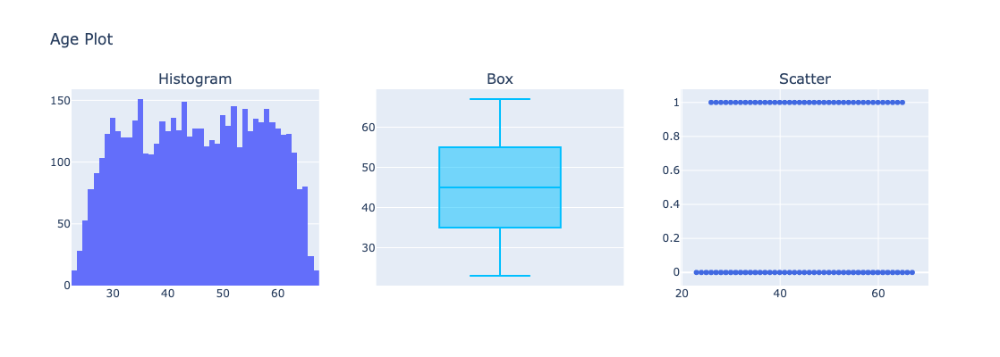

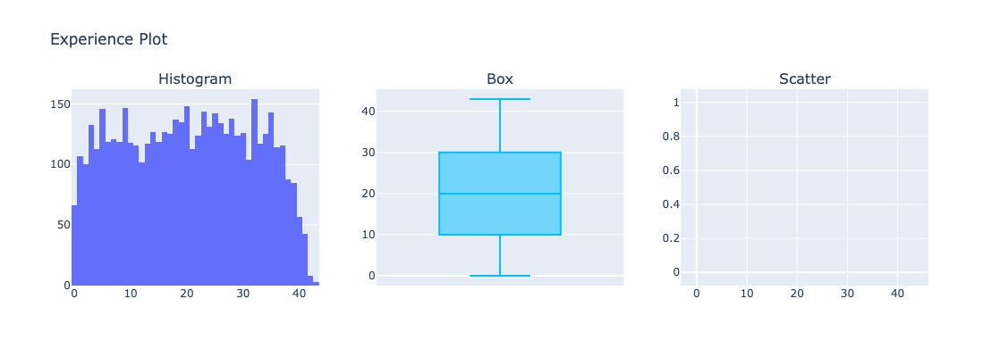

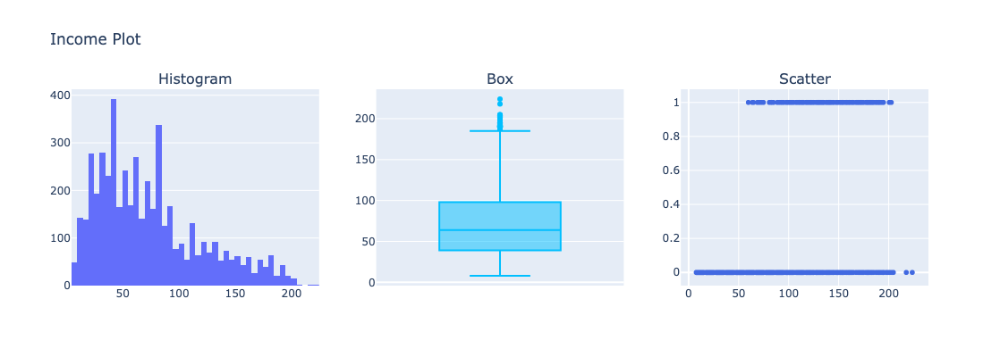

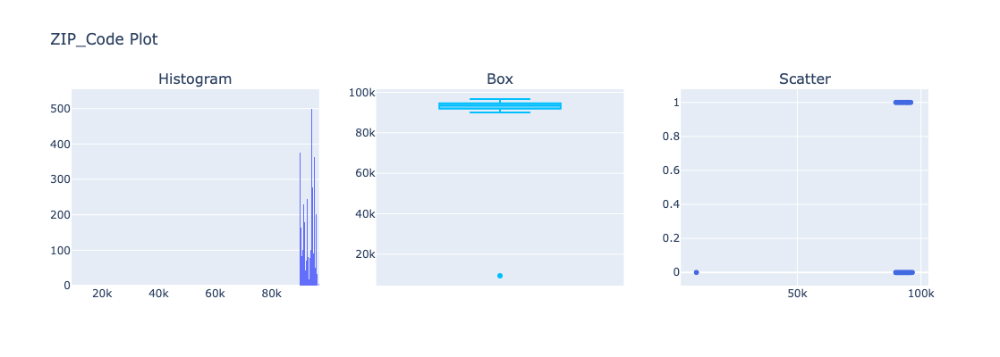

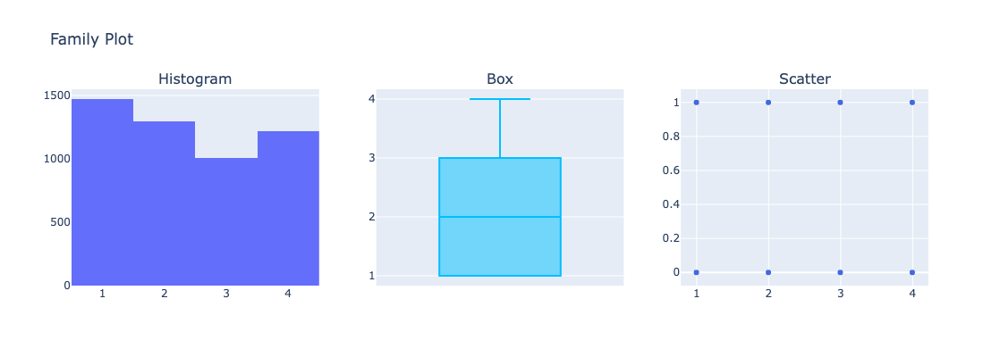

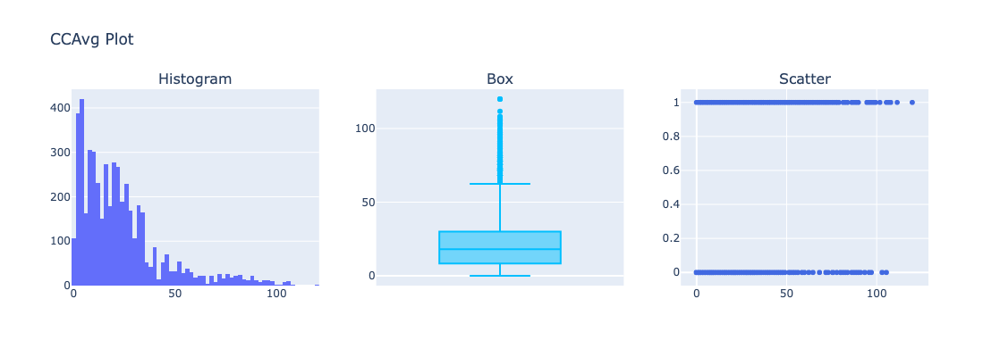

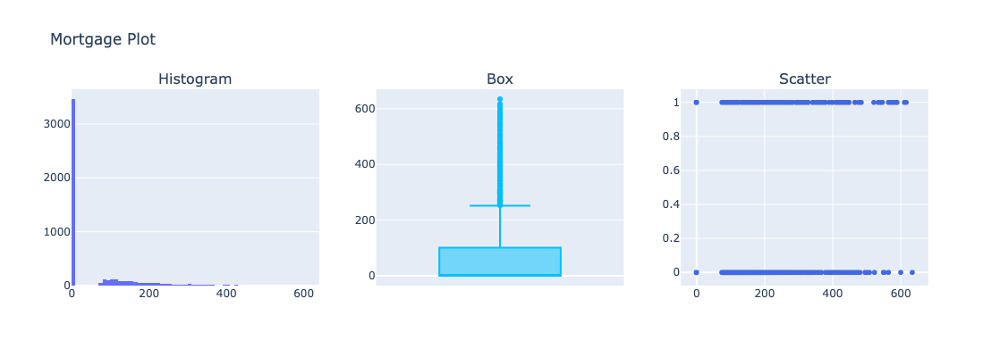

In [123]:
for i in numericaldf:
    
    fig = sp.make_subplots(rows=1, cols=3, subplot_titles=("Histogram", "Box", "Scatter"))

    # Histogram (countplot)
    hist = px.histogram(df1, x=i,title=f'{i} Count')
    fig.add_trace(hist.data[0], row=1, col=1)

    # Boxplot
    box = px.box(df1, y=i, color_discrete_sequence=['DeepSkyBlue'], title=f'{i} Boxplot')
    fig.add_trace(box.data[0], row=1, col=2)

    # Scatter plot
    scatter = px.scatter(df1, x=i, y="Personal_Loan", color_discrete_sequence=['royalblue'], title=f'{i} Scatter')
    fig.add_trace(scatter.data[0], row=1, col=3)

    # Update layout
    fig.update_layout(title_text=f'{i} Plot', showlegend=False, height=400, width=1200)
    
    # Show the figure
    fig.show()

**OBSERVATIONS FROM THE ABOVE GRAPHS**

**AGE** : From the histogram we notice that ages close to  30,40,45,50 and 60 years have a spike suggesting customers around these ages are the most reported ones in the bank.The Median of age from the box plot is seen to be 40 years. No outliers are present as suggested from the scatter plot and box plot

**EXPERIENCE** : From the histogram we notice that experiences close to 5,10,20 and 30 years have spikes suggesting customers with such experiences are the reported ones.The median experience as suggested by the box plot is 20 years.The scatter and box plots donot suggest presence of any outliers.

**INCOME** : The histogram suggests a right-skewed distribution. Frequency of income is reported to be higher for lower values. The median as suggested by the box plot is 64.The scatter and box plots suggest the presence of outliers.

**ZIP_Code** : As we can infer from the scatter plot,there is noise in this data.There is one zipcode 9307 which is a number largely different from the other zipcodes.We need to dive deeper into this variable.

**FAMILY** : The histogram suggests that maximum customers have one family member.The median is 2.No outliers can be detected from the box plot or scatter plot.

**CCAvg** : The histogram suggests a right-skewed distribution. Frequency of CCAvg is reported to be higher for lower values.The median lies at 18 with presence of significant amount of outliers as suggested by the box plot and scatter plot.

**MORTGAGE PLOT** : More than 50% of the dataset has zero value.

In [124]:
categoricaldf=df1.drop(['ID','ZIP_Code','Age','Experience','Income','CCAvg','Family','Mortgage'],axis=1)
categoricaldf

,Education,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,decade
0,1,0,1,0,0,0,twenty
1,1,0,1,0,0,0,forty
2,1,0,0,0,0,0,thirty
3,2,0,0,0,0,0,thirty
4,2,0,0,0,0,1,thirty
...,...,...,...,...,...,...,...
4995,3,0,0,0,1,0,twenty
4996,1,0,0,0,1,0,thirty
4997,3,0,0,0,0,0,sixty
4998,2,0,0,0,1,0,sixty


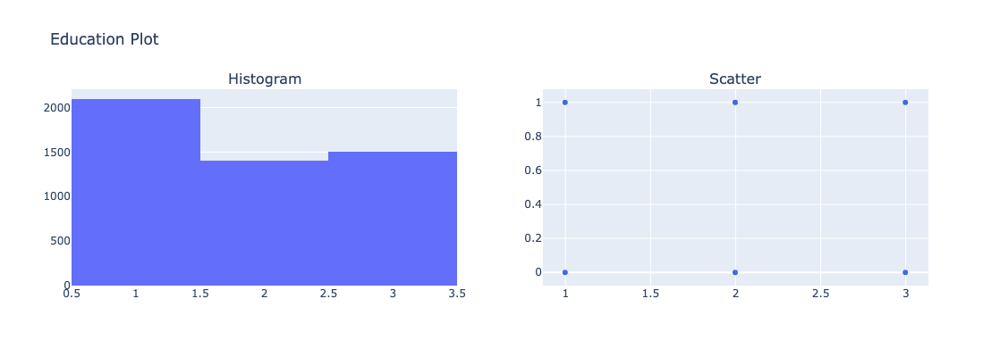

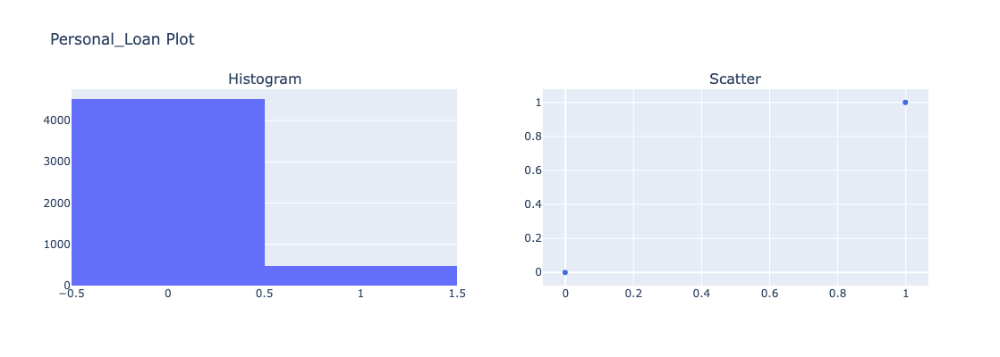

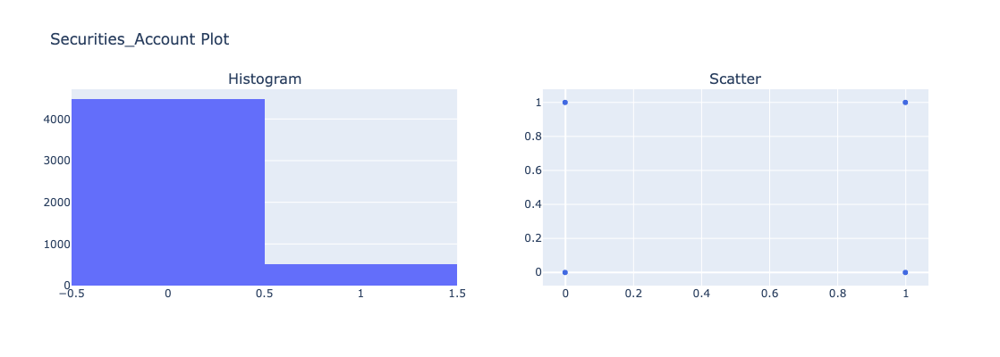

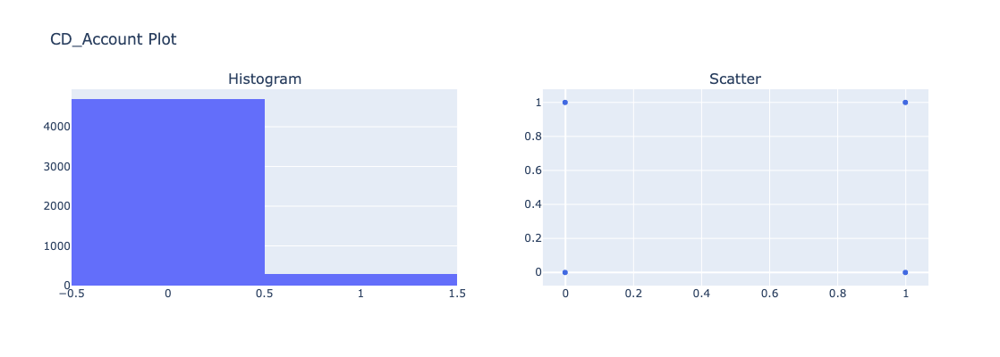

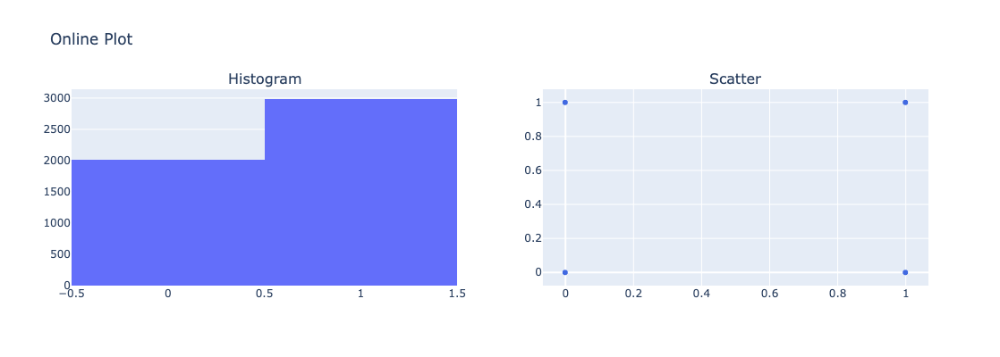

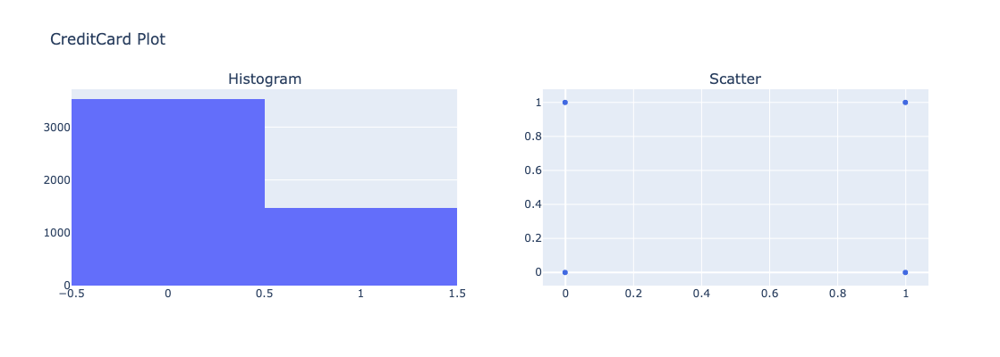

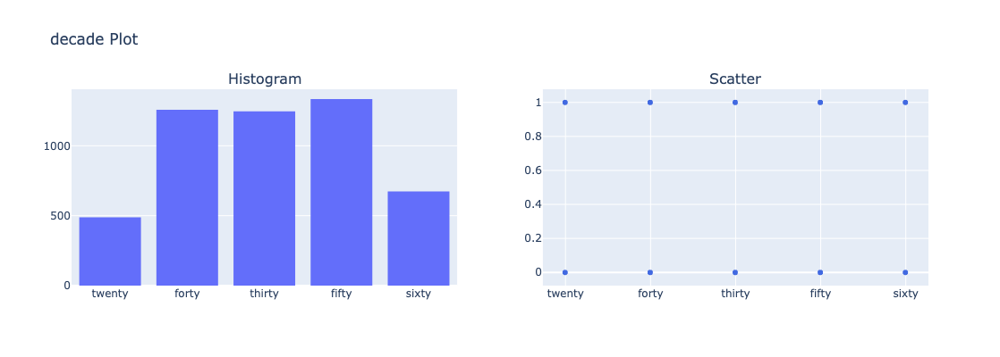

In [125]:
for i in categoricaldf:
    
    fig = sp.make_subplots(rows=1, cols=2, subplot_titles=("Histogram", "Scatter"))

    # Histogram (countplot)
    hist = px.histogram(df1, x=i,title=f'{i} Count')
    fig.add_trace(hist.data[0], row=1, col=1)

    # Scatter plot
    scatter = px.scatter(df1, x=i, y="Personal_Loan", color_discrete_sequence=['royalblue'], title=f'{i} Scatter')
    fig.add_trace(scatter.data[0], row=1, col=2)

    # Update layout
    fig.update_layout(title_text=f'{i} Plot', showlegend=False, height=400, width=1100)
    
    # Show the figure
    fig.show()

**OBSERVATIONS FROM THE ABOVE GRAPH:**

**Education** : Customers with undergraduate degree are the most reported ones, followed by the advanced and graduate degrees in that order.

**Personal_Loan** : 4520 customers out of 5000 customers have been reported to have not availed the personal loan offered by the bank.

**Securities_Account** : 4478 customers out of 5000 customers donot have a securities account in the bank.

**CD_Account** : 4698 customers out of 5000 customers donot have certificate of deposit account in the bank.

**Online** : 2984 customers avail the internet banking facility provided by the bank.

**CreditCard** : 3530 customers out of 5000 customers are reported to not have availed the credit card facility provided by the bank.

**decade** : Customers in their fifties are the most frequent ones and the ones in their twenties and sixties are the least reported ones in the dataset.











Since we could detect noise in the Zip_code data,we need to deal with that.


## **NOISE DATA ELIMINATION**

In [126]:
!pip install pgeocode

In [127]:
import pgeocode

# retrieving detailed location information (like city, state, latitude, longitude) for a list of ZIP codes

zip_list=(df['ZIP_Code'].tolist())
zip=[str(x) for x in zip_list]

nomi = pgeocode.Nominatim('Us')
address1= nomi.query_postal_code(zip)
address1

,postal_code,country_code,place_name,state_name,state_code,county_name,county_code,community_name,community_code,latitude,longitude,accuracy
0,91107,US,Pasadena,California,CA,Los Angeles,37.0,NaN,NaN,34.1510,-118.0889,4.0
1,90089,US,Los Angeles,California,CA,Los Angeles,37.0,NaN,NaN,33.7866,-118.2987,4.0
2,94720,US,Berkeley,California,CA,Alameda,1.0,NaN,NaN,37.8738,-122.2549,4.0
3,94112,US,San Francisco,California,CA,City and County of San Francisco,75.0,NaN,NaN,37.7195,-122.4411,4.0
4,91330,US,Northridge,California,CA,Los Angeles,37.0,NaN,NaN,34.2283,-118.5368,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...
4995,92697,US,Irvine,California,CA,Orange,59.0,NaN,NaN,33.6485,-117.8387,4.0
4996,92037,US,La Jolla,California,CA,San Diego,73.0,NaN,NaN,32.8455,-117.2521,4.0
4997,93023,US,Ojai,California,CA,Ventura,111.0,NaN,NaN,34.4451,-119.2565,4.0
4998,90034,US,Los Angeles,California,CA,Los Angeles,37.0,NaN,NaN,34.0290,-118.4005,4.0


In [128]:
#dropping the columns which may not help us later on in the data analysis
address1.drop(["community_name" ,"community_code","state_name", "state_code","country_code", "accuracy","postal_code"],axis='columns', inplace=True)
address1

,place_name,county_name,county_code,latitude,longitude
0,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,Berkeley,Alameda,1.0,37.8738,-122.2549
3,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...
4995,Irvine,Orange,59.0,33.6485,-117.8387
4996,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,Ojai,Ventura,111.0,34.4451,-119.2565
4998,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


In [129]:
# looking for null values

address1.isnull().sum()

place_name     41
county_name    41
county_code    41
latitude       41
longitude      41
dtype: int64

In [130]:
df1 = pd.concat([df, address1], axis=1)
df1

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,decade,place_name,county_name,county_code,latitude,longitude
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0,twenty,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0,forty,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0,thirty,Berkeley,Alameda,1.0,37.8738,-122.2549
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0,thirty,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1,thirty,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0,twenty,Irvine,Orange,59.0,33.6485,-117.8387
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0,thirty,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0,sixty,Ojai,Ventura,111.0,34.4451,-119.2565
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0,sixty,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


In [131]:
df2= df1[df1["ZIP_Code"]>20000] 
df3=df2.dropna()  
df3

,ID,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Personal_Loan,Securities_Account,CD_Account,Online,CreditCard,decade,place_name,county_name,county_code,latitude,longitude
0,1,25,1,49,91107,4,19.2,1,0,0,1,0,0,0,twenty,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,2,45,19,34,90089,3,18.0,1,0,0,1,0,0,0,forty,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,3,39,15,11,94720,1,12.0,1,0,0,0,0,0,0,thirty,Berkeley,Alameda,1.0,37.8738,-122.2549
3,4,35,9,100,94112,1,32.4,2,0,0,0,0,0,0,thirty,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,5,35,8,45,91330,4,12.0,2,0,0,0,0,0,1,thirty,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,4996,29,3,40,92697,1,22.8,3,0,0,0,0,1,0,twenty,Irvine,Orange,59.0,33.6485,-117.8387
4996,4997,30,4,15,92037,4,4.8,1,85,0,0,0,1,0,thirty,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,4998,63,39,24,93023,2,3.6,3,0,0,0,0,0,0,sixty,Ojai,Ventura,111.0,34.4451,-119.2565
4998,4999,65,40,49,90034,3,6.0,2,0,0,0,0,1,0,sixty,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


In [132]:
df3.shape

(4959, 20)

41 rows have been removed which contained noise or missing values

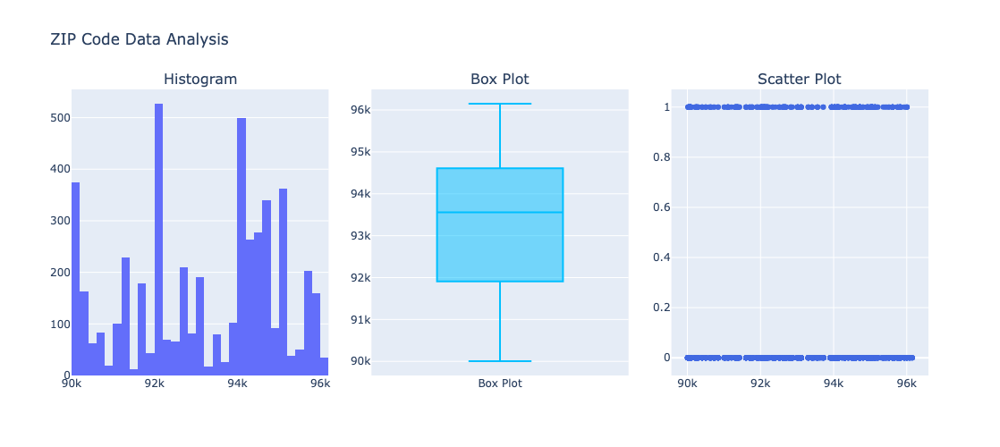

In [133]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create subplots
fig = make_subplots(
    rows=1, cols=3, 
    subplot_titles=("Histogram", "Box Plot", "Scatter Plot"),
    horizontal_spacing=0.05
)

# Histogram
fig.add_trace(
    go.Histogram(x=df3['ZIP_Code'], name="Histogram"),
    row=1, col=1
)

# Box Plot
fig.add_trace(
    go.Box(y=df3['ZIP_Code'], name="Box Plot", marker_color='DeepSkyBlue'),
    row=1, col=2
)

# Scatter Plot
fig.add_trace(
    go.Scatter(x=df3['ZIP_Code'], y=df3['Personal_Loan'], mode='markers', name="Scatter Plot", marker_color='royalblue'),
    row=1, col=3
)

# Update layout
fig.update_layout(
    title_text="ZIP Code Data Analysis",
    height=500,
    width=1200,
    showlegend=False
)

# Show plot
fig.show()


As we can see now, the maximum customers of the bank are reported to have their Zip codes around 92000 and 94000.The median of the variable is 93.55k and the noise detected earlier has been removed as seen from the box plot.

#### **CORRELATION MATRIX FOR NUMERICAL VARIABLES:**

                  Age  Experience    Income  ZIP_Code  Family     CCAvg  \
Age               NaN    0.993971       NaN       NaN     NaN       NaN   
Experience   0.993971         NaN       NaN       NaN     NaN       NaN   
Income            NaN         NaN       NaN       NaN     NaN  0.645262   
ZIP_Code          NaN         NaN       NaN       NaN     NaN       NaN   
Family            NaN         NaN       NaN       NaN     NaN       NaN   
CCAvg             NaN         NaN  0.645262       NaN     NaN       NaN   
Mortgage          NaN         NaN       NaN       NaN     NaN       NaN   
county_code       NaN         NaN       NaN       NaN     NaN       NaN   
latitude          NaN         NaN       NaN  0.867095     NaN       NaN   
longitude         NaN         NaN       NaN       NaN     NaN       NaN   

             Mortgage  county_code  latitude  longitude  
Age               NaN          NaN       NaN        NaN  
Experience        NaN          NaN       NaN        NaN  


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

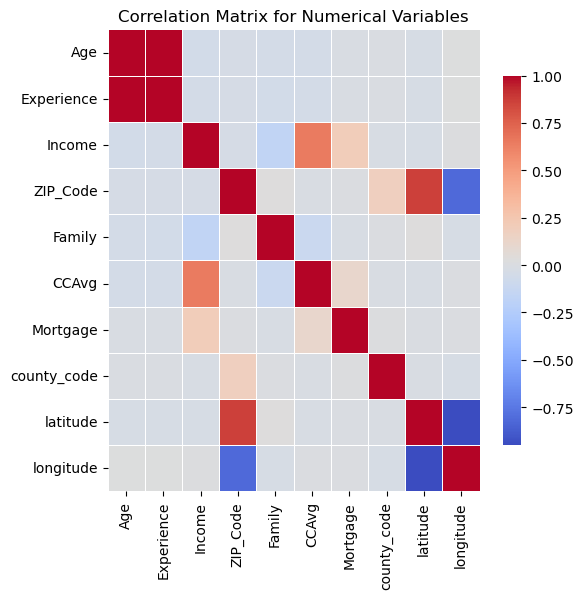

In [134]:
# List of numerical variables
numerical_cols = ['Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg', 'Mortgage', 
                  'county_code', 'latitude', 'longitude']



# Calculate correlation matrix
correlation_matrix = df3[numerical_cols].corr()
filtered_corr = correlation_matrix.where((correlation_matrix > 0.50) & (correlation_matrix < 1.0))
print(filtered_corr)

# Plot correlation heatmap
plt.figure(figsize=(6,6))
sns.heatmap(correlation_matrix,cmap='coolwarm',linewidths=0.5,cbar_kws={"shrink": 0.8} )
plt.title("Correlation Matrix for Numerical Variables")
plt.show()


After taking 0.50 as the threshold for positively correalated variables, we find that:

1)Age and Experience have a strong positive correlation.

2)Income and CCAvg have a strong positive correlation.

3)Zip_Code and latitude has a strong positive correlation (but this may not give any useful information later on)

### **BIVARIATE ANALYSIS FOR THE HIGHLY CORRELATED NUMERICAL VS NUMERICAL VARIABLES:**

In [135]:
from scipy.stats import pearsonr

#checking for statistical measures to establish the relation between age and experience
#Null hypothesis(H0) : There is no linear relationship between the two variables
#Alternate hypothesis(H1) : There is a linear relationship between the two variables

corr, p_value = pearsonr(df3['Age'], df3['Experience'])
print(f"Correlation Coefficient: {corr}, P-value: {p_value}")

# Hypothesis testing
alpha = 0.05  # Significance level
if p_value < alpha:
    print("Reject the Null Hypothesis (H0): There is a linear relationship between Age and Experience.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no linear relationship between Age and Experience.")



Correlation Coefficient: 0.9939707092032523, P-value: 0.0
Reject the Null Hypothesis (H0): There is a linear relationship between Age and Experience.


**With age,experience increases**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

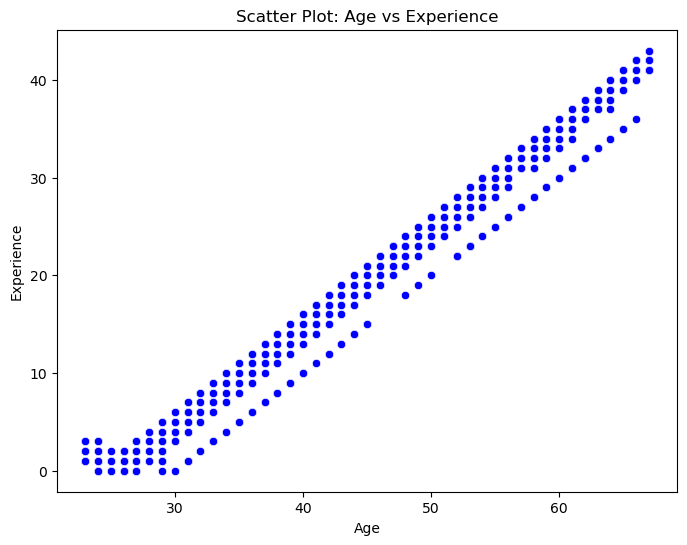

In [136]:
# Scatter plot for Age vs Experience
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Age', y='Experience', data=df, color='blue')
plt.title('Scatter Plot: Age vs Experience')
plt.xlabel('Age')
plt.ylabel('Experience')
plt.show()


As seen from the average graph,Age and experience have a positive linear relation.

In [137]:
from scipy.stats import pearsonr

#checking for statistical measures to establish the relation between Income and CCAvg
#Null hypothesis(H0) : There is no linear relationship between the two variables
#Alternate hypothesis(H1) : There is a linear relationship between the two variables

corr, p_value = pearsonr(df['Income'], df['CCAvg'])
print(f"Correlation Coefficient: {corr}, P-value: {p_value}")

# Hypothesis testing
alpha = 0.05  # Significance level
if p_value < alpha:
    print("Reject the Null Hypothesis (H0): There is a linear relationship between Income and CCAvg.")
else:
    print("Fail to Reject the Null Hypothesis (H0): There is no linear relationship between Income and CCAvg.")

Correlation Coefficient: 0.6459836696249709, P-value: 0.0
Reject the Null Hypothesis (H0): There is a linear relationship between Income and CCAvg.


**As income increases,the average spending on credit card increases**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

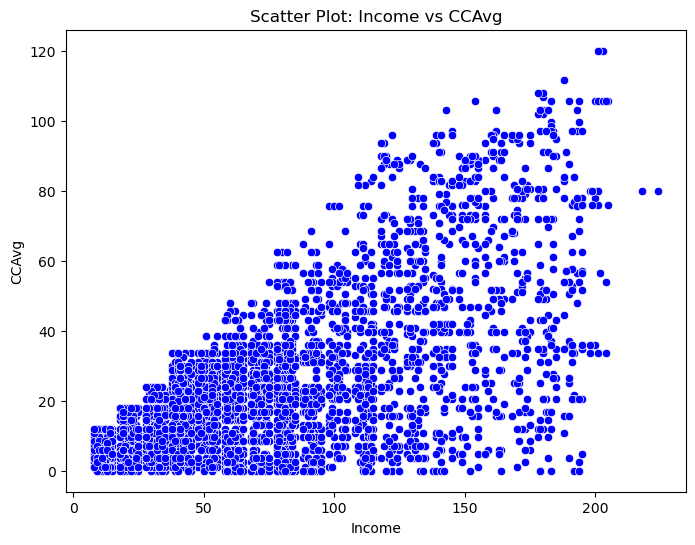

In [138]:
# Scatter plot for Income vs CCAvg
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Income', y='CCAvg', data=df, color='blue')
plt.title('Scatter Plot: Income vs CCAvg')
plt.xlabel('Income')
plt.ylabel('CCAvg')
plt.show()

As seen from the average graph,with increasing income,CCAvg increases.

### **BIVARIATE ANALYSIS FOR ALL NUMERICAL VARIABLES VS TARGET VARIABLE:**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

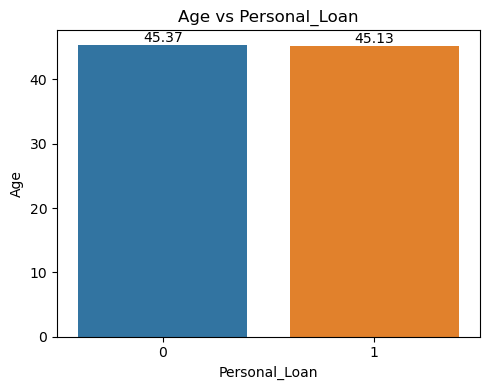

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

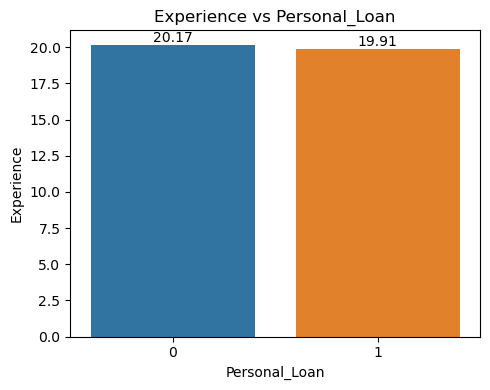

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

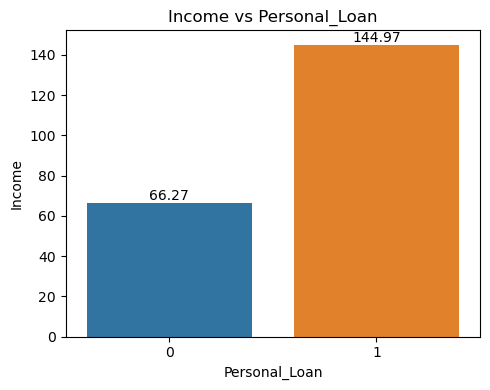

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

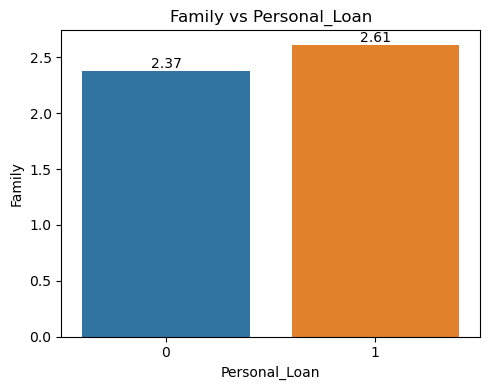

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

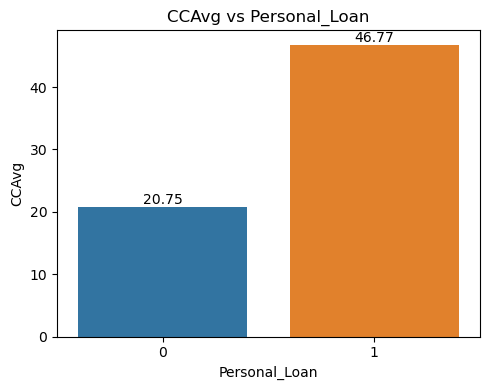

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

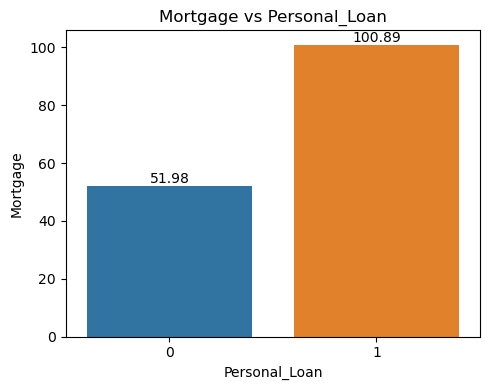

In [139]:
numerical_cols = ['Age', 'Experience', 'Income','Family', 'CCAvg', 'Mortgage']
                

target_variable = 'Personal_Loan'  

for var in numerical_cols:
    plt.figure(figsize=(5,4))
    # Create the bar plot
    bar_plot = sns.barplot(x=target_variable, y=var, data=df3, ci=None)

    # Annotate each bar with its y-value
    for bar in bar_plot.patches:
        bar_height = bar.get_height()
        bar_x = bar.get_x() + bar.get_width() / 2
        plt.text(bar_x, bar_height, f'{bar_height:.2f}', ha='center', va='bottom')

    # Customize the plot
    plt.title(f'{var} vs {target_variable}')
    plt.xlabel(target_variable)
    plt.ylabel(var)
    plt.tight_layout()

    # Show the plot
    plt.show()

**OBSERVATIONS FROM THE ABOVE GRAPHS:**

1) **AGE VS PERSONAL LOAN:** No major difference is observed between the the ages of the loan takers and the ones who didnot take the loan.
2) **EXPERIENCE VS PERSONAL LOAN:** No major difference is observed in the experience of the loan takers and the ones who didnot take the loan.
3) **INCOME VS PERSONAL LOAN:** The ones with higher income tend to avail the loan as compared to the ones with lower income.
4) **FAMILY VS PERSONAL LOAN:** The ones with more number of members in the family are more tending to avail the loan facility.
5) **CCAvg VS PERSONAL LOAN:** Customers with more monthly Credit card spending average are more prone to taking the loan.
6) **MORTGAGE VS PERSONAL LOAN:** Customers with their houses mortgaged with the bank are more prone towards availing the loan facility.



### **CHI-SQUARE TEST TO CHECK THE DEPENDENCY OF CATEGORICAL VARIABLES:**

In [140]:
categorical_cols=['Education','Personal_Loan','Securities_Account','CD_Account','Online','CreditCard','decade','place_name']

In [141]:
import pandas as pd
from scipy.stats import chi2_contingency
from itertools import combinations



# Function to perform Chi-Square test and print results
def chi_square_test(data, vars_list):
    results = []
    for var1, var2 in combinations(vars_list, 2):
        contingency_table = pd.crosstab(df3[var1], df3[var2])
        chi2, p, dof, expected = chi2_contingency(contingency_table)
        results.append((var1, var2, chi2, p))
    
    return pd.DataFrame(results, columns=['Variable 1', 'Variable 2', 'Chi-Square Value', 'P-Value'])

# Perform the Chi-Square Test
chi_square_results = chi_square_test(df3, categorical_cols)

# Filter and display pairs with significant dependency (P-Value < 0.05)
significant_results = chi_square_results[chi_square_results['P-Value'] < 0.05]
print("Significant Dependencies:")
print(significant_results)


Significant Dependencies:
            Variable 1     Variable 2  Chi-Square Value        P-Value
0            Education  Personal_Loan        111.431864   6.351529e-25
5            Education         decade         28.839383   3.383472e-04
8        Personal_Loan     CD_Account        496.262575  6.182507e-110
13  Securities_Account     CD_Account        500.855053  6.193388e-111
18          CD_Account         Online        153.017510   3.797048e-35
19          CD_Account     CreditCard        386.296771   5.297664e-86


### **BIVARIATE ANALYSIS FOR THE CATEGORICAL VARIABLES HAVING SIGNIFICANT DEPENDENCIES**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

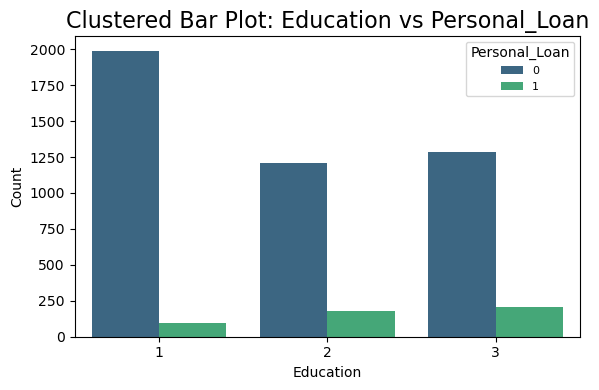

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

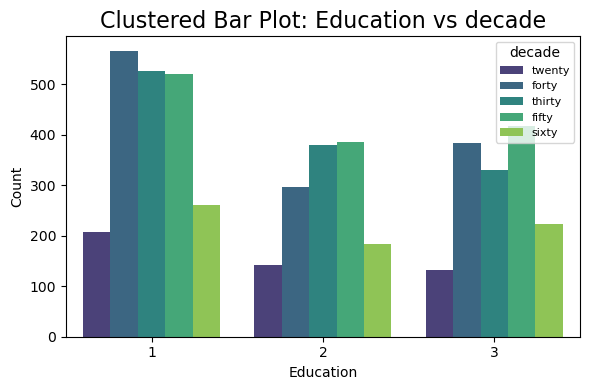

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

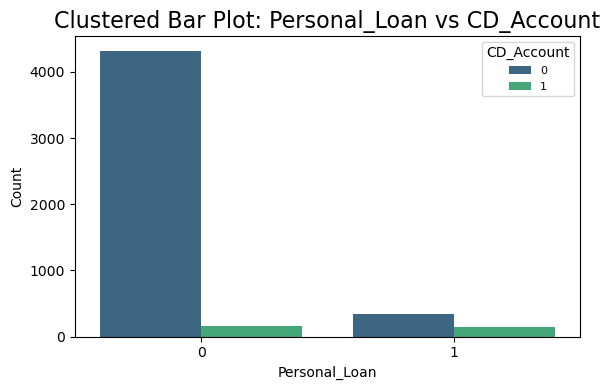

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

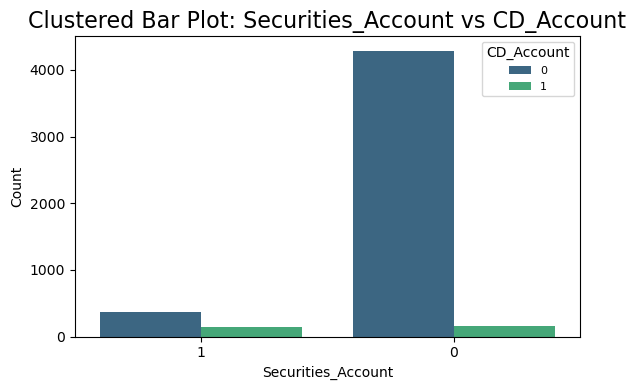

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

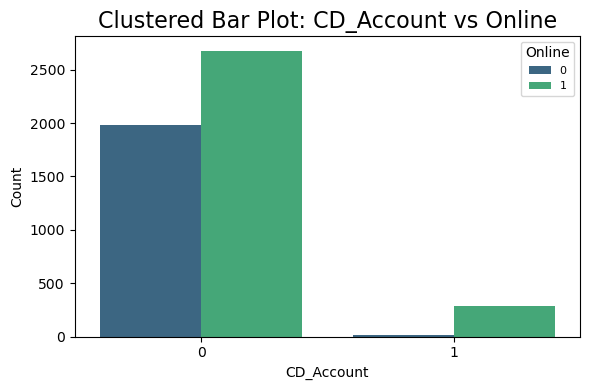

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

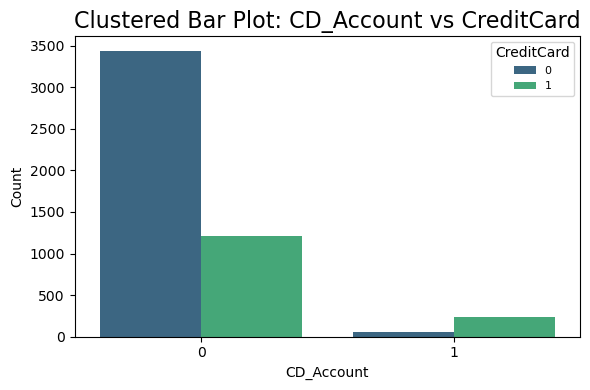

In [142]:

df3[categorical_cols] = df3[categorical_cols].astype(str)

# List of significant combinations
combinations = [
    ('Education', 'Personal_Loan'),
    ('Education', 'decade'),
    ('Personal_Loan', 'CD_Account'),
    ('Securities_Account', 'CD_Account'),
    ('CD_Account', 'Online'),
    ('CD_Account', 'CreditCard')
]

# Plot clustered bar plots for each pair
for x_var, hue_var in combinations:
    plt.figure(figsize=(6, 4))
    sns.countplot(data=df3, x=x_var, hue=hue_var, palette='viridis')
    
    plt.title(f'Clustered Bar Plot: {x_var} vs {hue_var}', fontsize=16)
    plt.xlabel(x_var, fontsize=10)
    plt.ylabel('Count', fontsize=10)
    plt.legend(title=hue_var, fontsize=8,loc='upper right')
    plt.tight_layout()
    plt.show()


**MAIN OBSERVATIONS FROM THE ABOVE GRAPHS:**

1) **EDUCATION VS PERSONAL LOAN:** People with more higher education tend to avail loan.
2) **PERSONAL LOAN VS CD_ACCOUNT:** There is no such relation between personal loan and CD_account.


### **BIVARIATE ANALYSIS FOR NUMERICAL VS CATEGORICAL VARIABLES WITH P-VALUE<0.05:**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

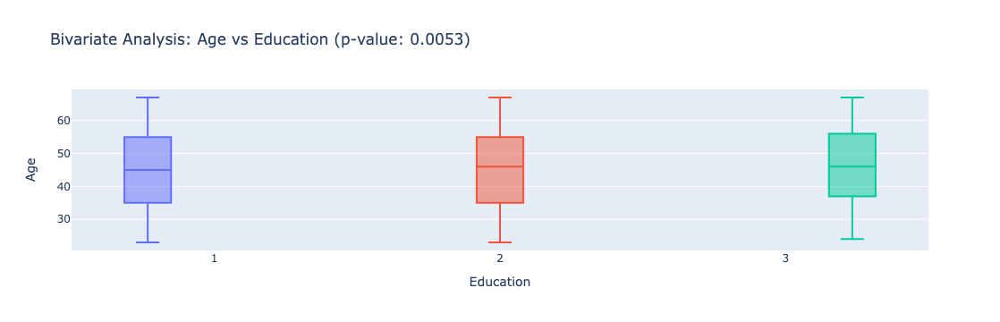

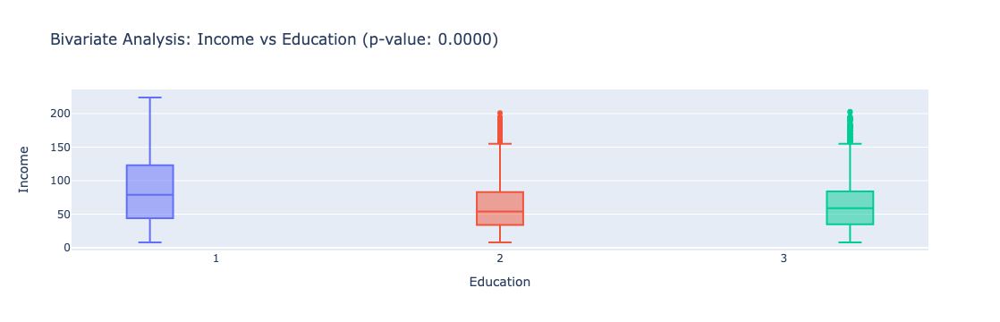

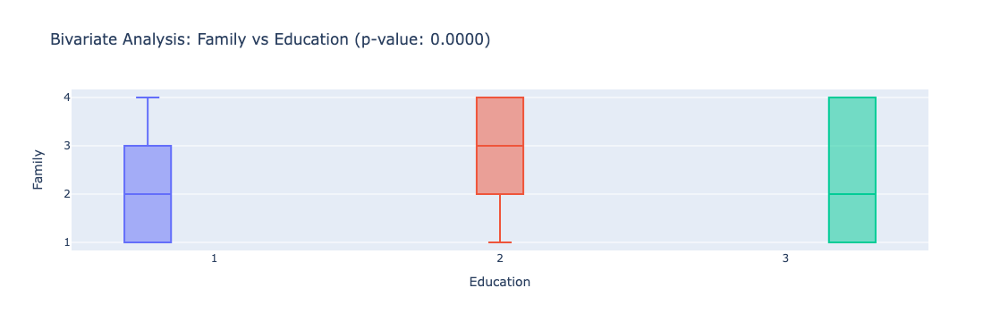

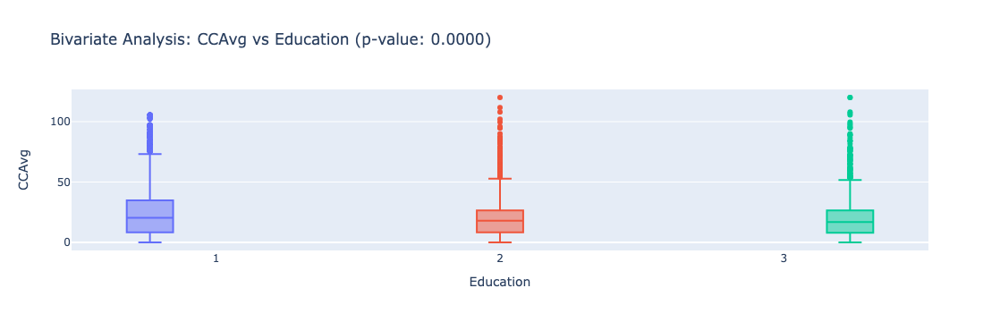

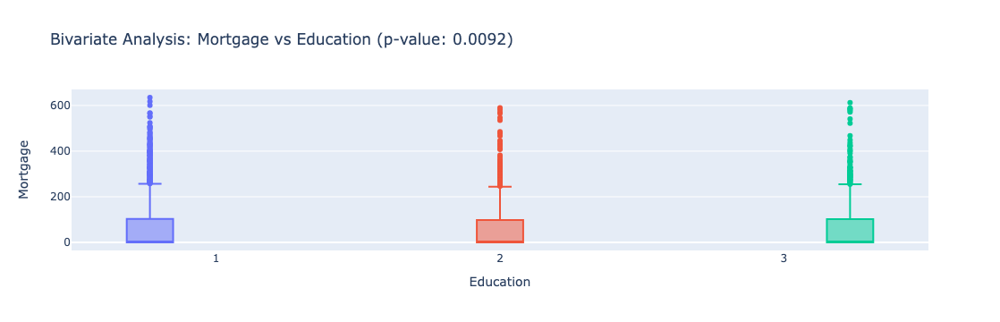

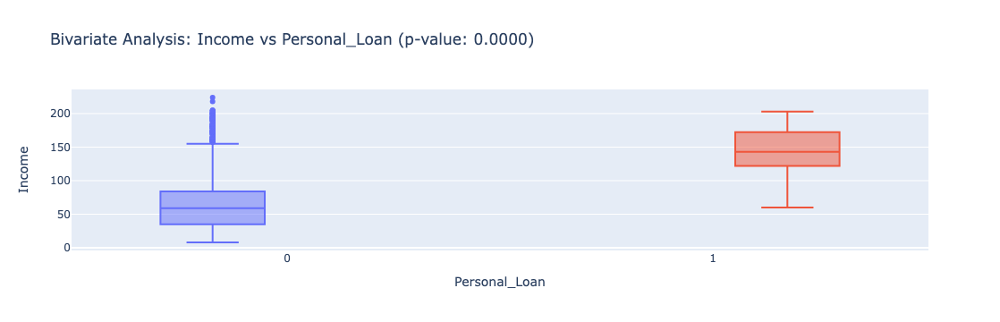

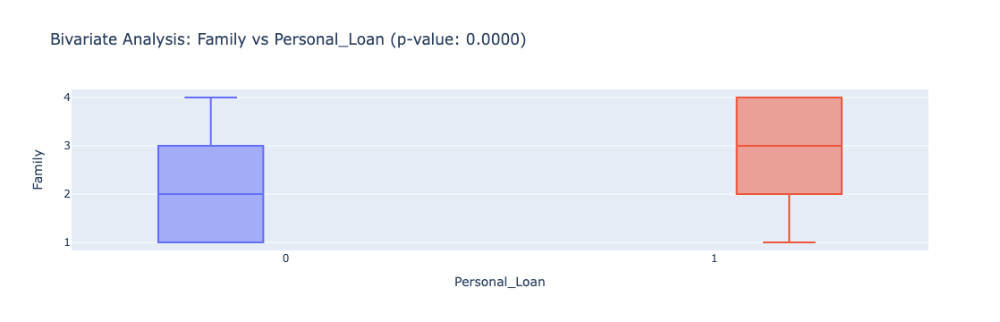

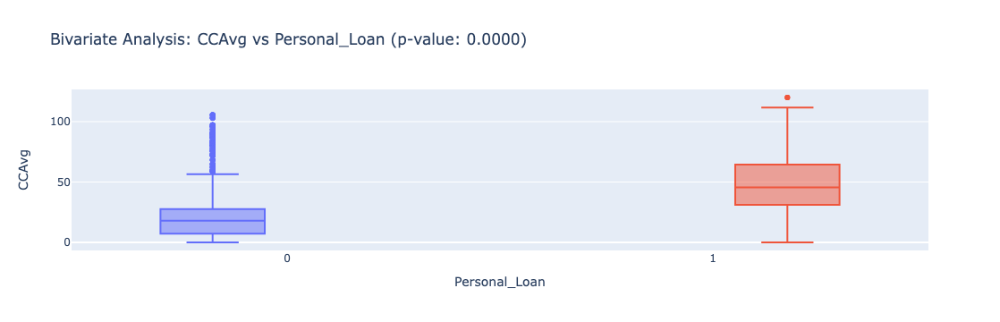

In [143]:
categorical_cols = ['Education', 'Personal_Loan', 'Securities_Account', 'CD_Account', 'Online', 'CreditCard', 'decade']
numerical_cols = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Mortgage']

# Function to perform ANOVA test
def anova_test(df, categorical, numerical):
    groups = [df[df[categorical] == category][numerical] for category in df[categorical].unique()]
    f_stat, p_value = stats.f_oneway(*groups)
    return p_value

# Dictionary to store dependent pairs
dependent_pairs = {}

# Perform ANOVA for all combinations of categorical and numerical variables
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        p_value = anova_test(df3, cat_col, num_col)
        if p_value < 0.05:  # Significant dependency
            if cat_col not in dependent_pairs:
                dependent_pairs[cat_col] = []
            dependent_pairs[cat_col].append((num_col, p_value))

# Plot interactive bivariate analysis for dependent pairs
for cat_col, num_pairs in dependent_pairs.items():
    for num_col, p_value in num_pairs:
        # Create an interactive box plot with Plotly
        fig = px.box(df3, x=cat_col, y=num_col, color=cat_col, 
                     title=f'Bivariate Analysis: {num_col} vs {cat_col} (p-value: {p_value:.4f})',
                     labels={cat_col: cat_col, num_col: num_col},
                     template="plotly")
        fig.update_layout(boxmode='group', showlegend=False, 
                          xaxis_title=cat_col, yaxis_title=num_col)
        fig.show()


**MAIN OBSERVATIONS FROM THE ABOVE GRAPH:**

1) **INCOME VS PERSONAL LOAN:** The median of income of the people availing the personal loan is much higher than those who didnot avail the loan.We notice the presence of outliers in this data.
2) **FAMILY VS PERSONAL LOAN:** Individuals with a personal loan tend to have larger family sizes compared to those without a personal loan, indicating a potential relationship between family size and the likelihood of taking a personal loan.
3) **CCAvg VS PERSONAL LOAN:** People who have availed the personal loan have a greater median for average spending on credit card.There are outliers present in this data.
4) **MORTGAGE VS PEROSNAL LOAN:** most individuals do not have a mortgage as understood from median zero for both cases of personal loan; however, those with a personal loan exhibit a higher range and variability in mortgage values compared to those without a personal loan.
   



### **MULTIVARIATE ANALYSIS:**

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

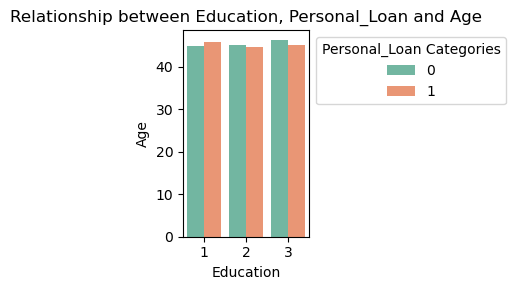

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

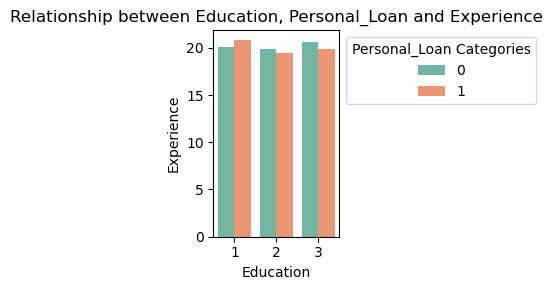

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

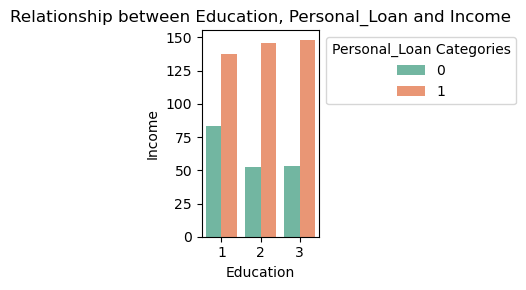

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

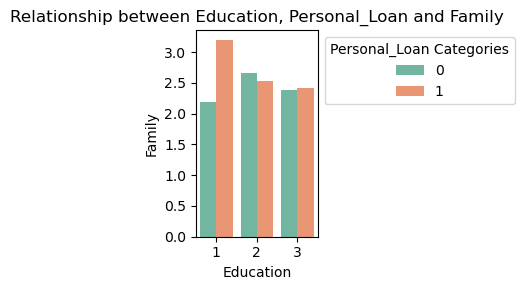

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

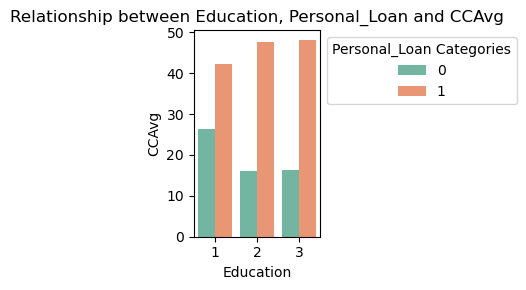

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

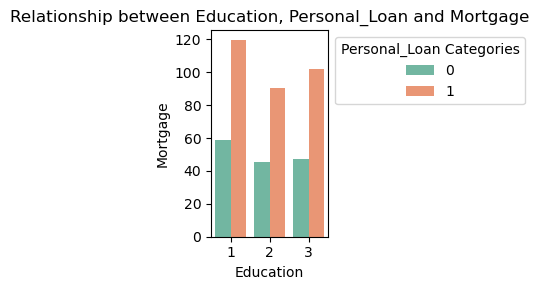

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

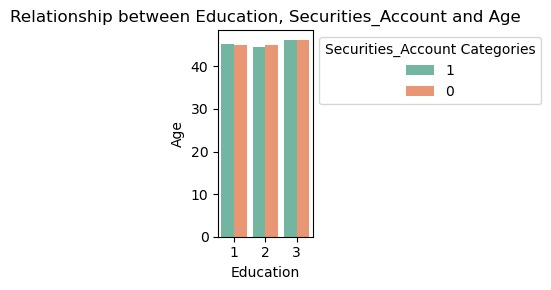

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

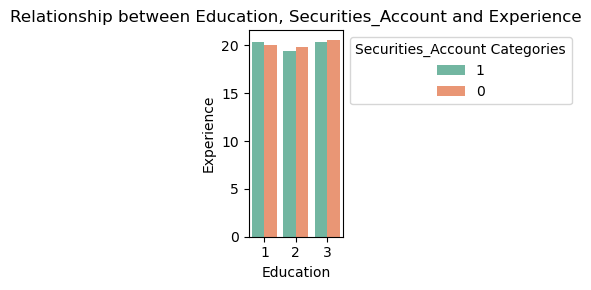

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

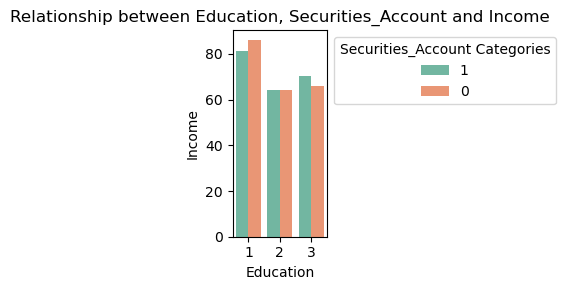

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

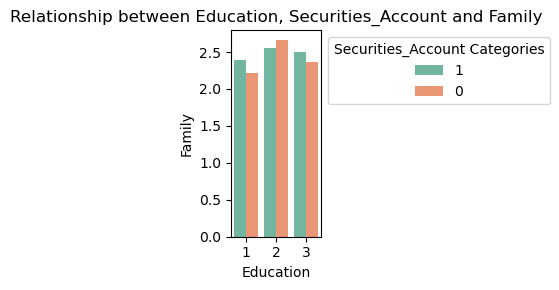

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

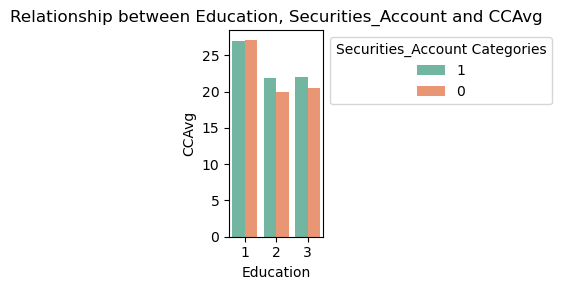

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

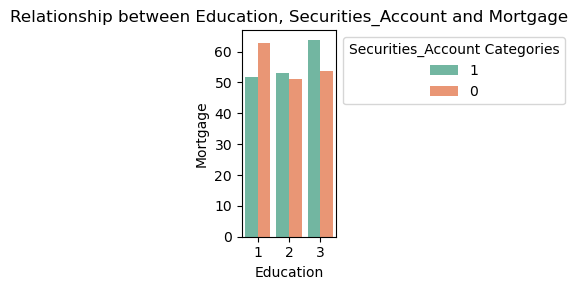

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

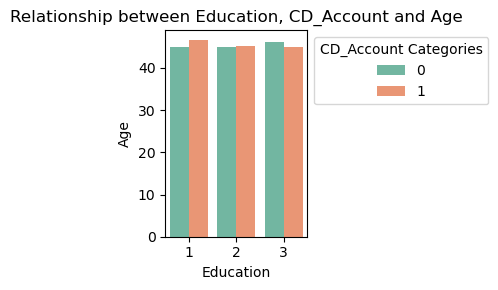

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

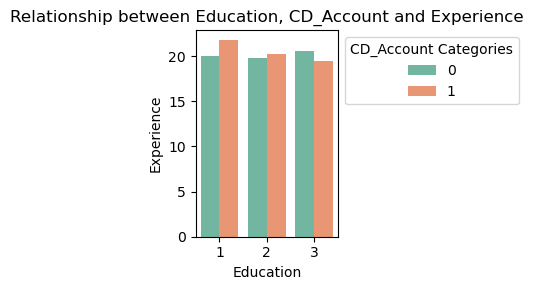

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

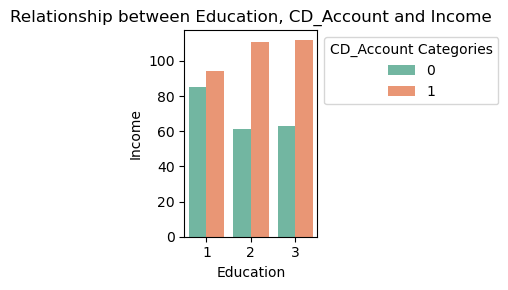

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

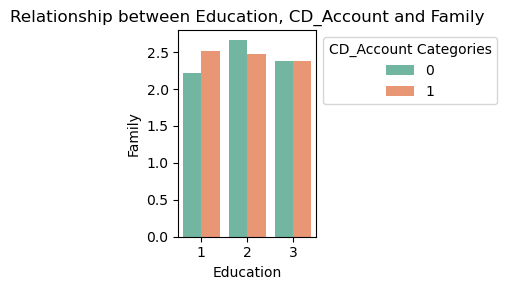

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

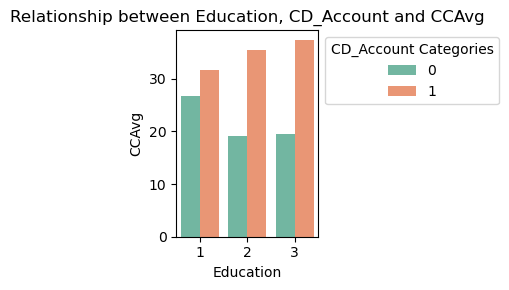

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

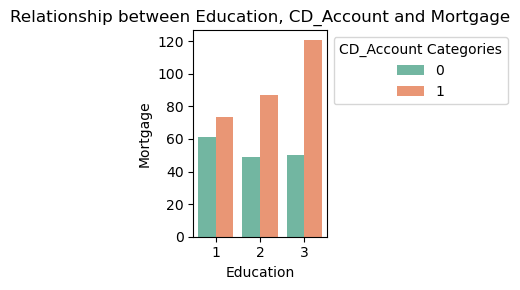

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

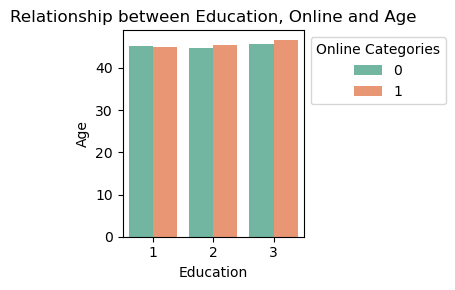

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

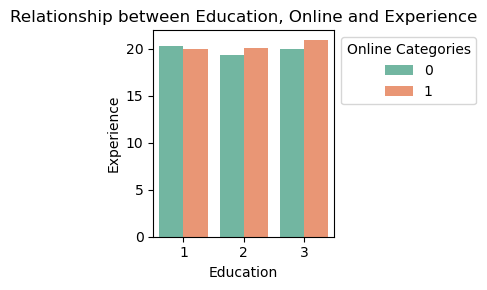

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

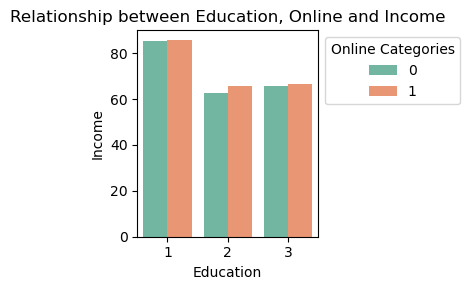

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

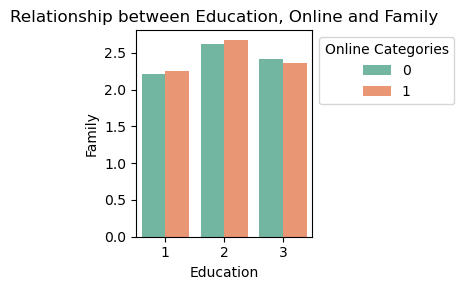

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

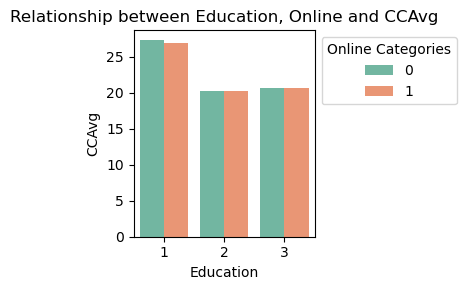

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

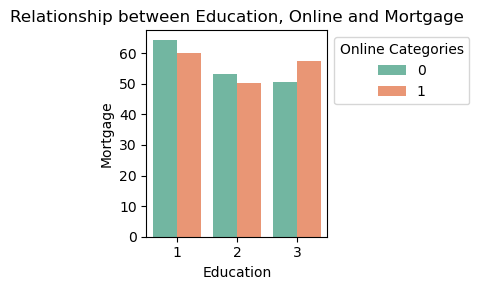

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

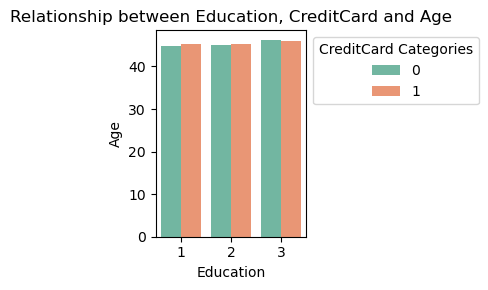

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

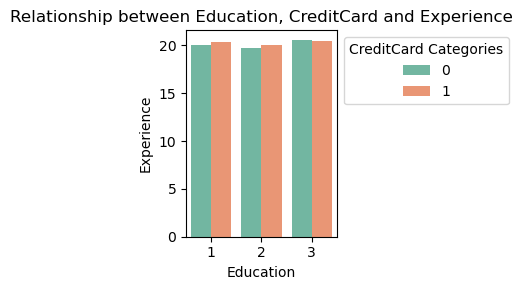

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

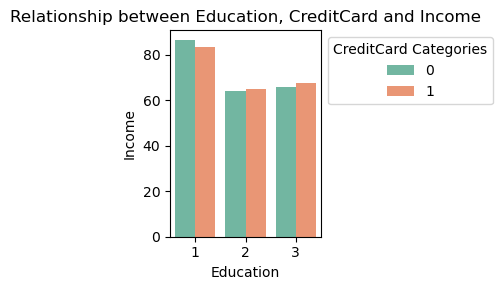

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

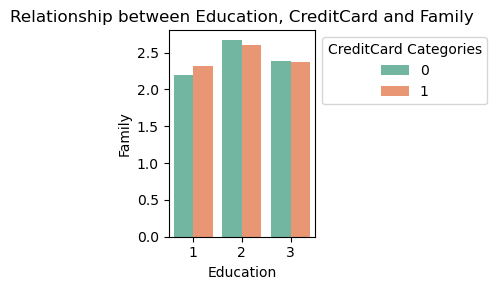

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

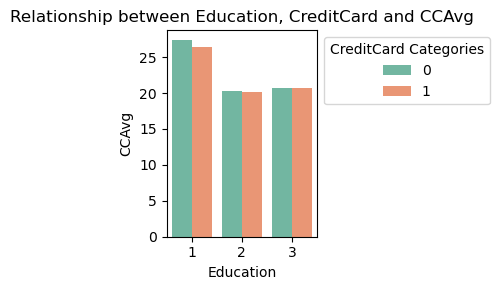

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

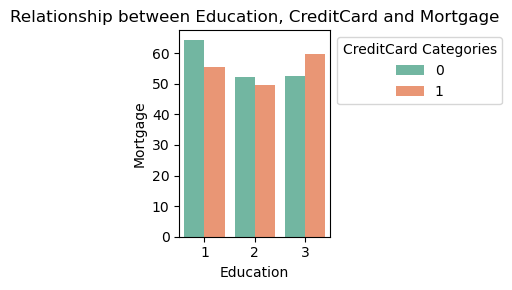

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

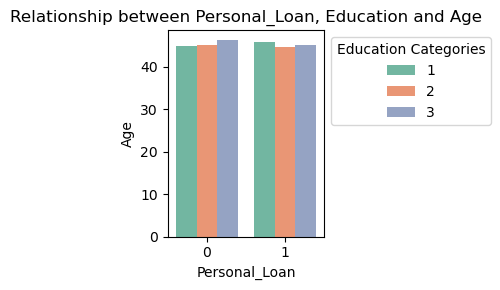

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

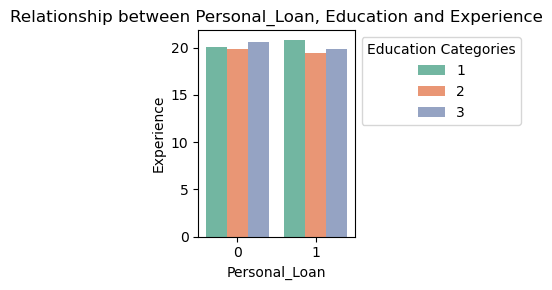

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

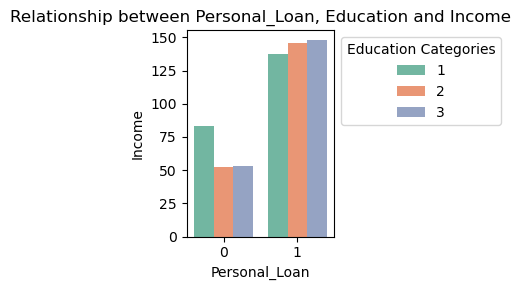

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

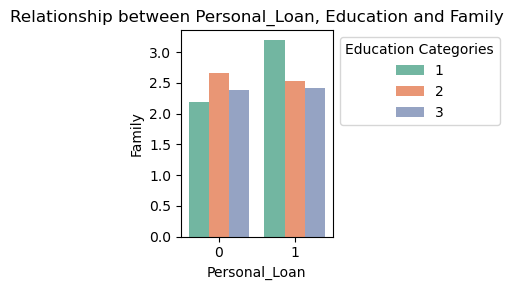

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

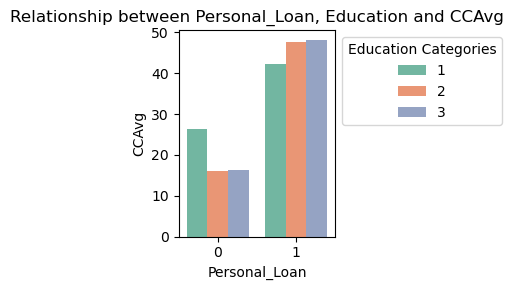

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

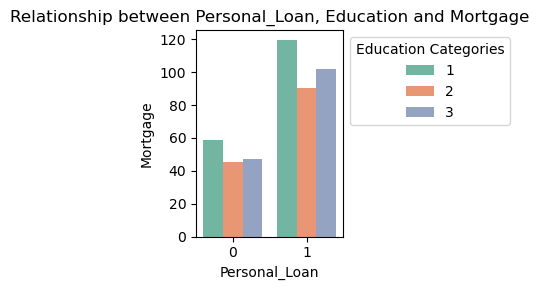

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

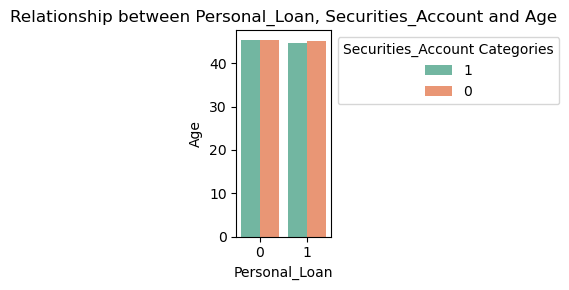

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

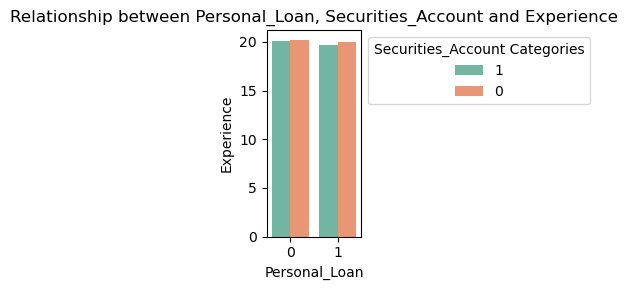

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

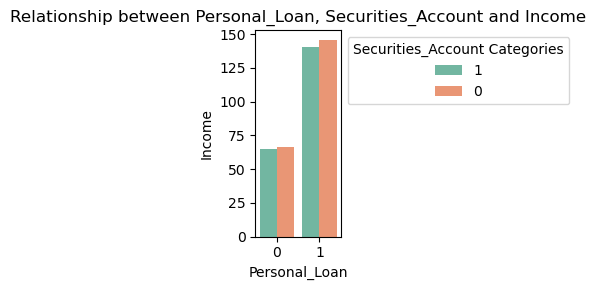

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

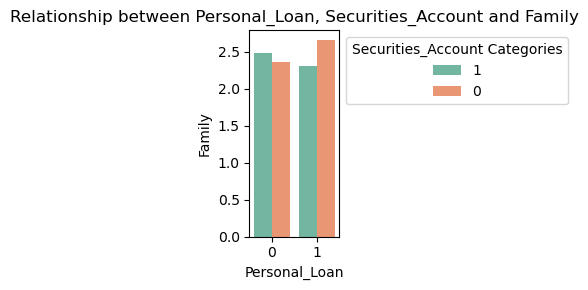

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

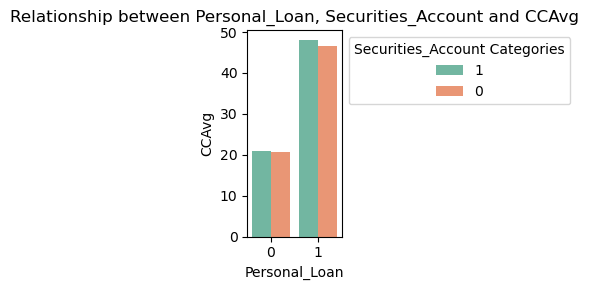

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

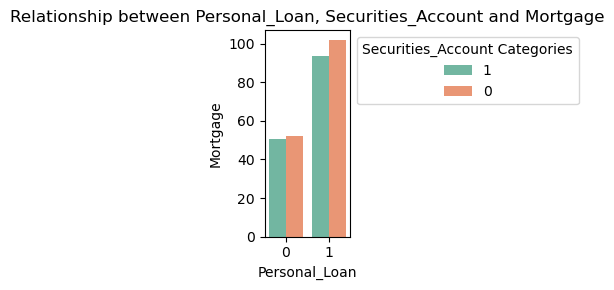

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

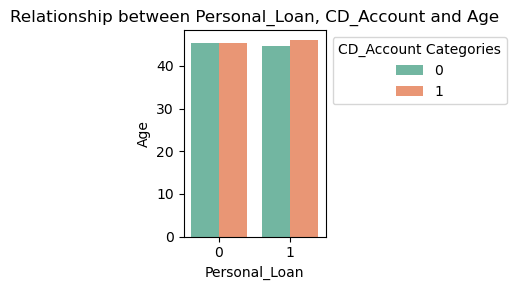

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

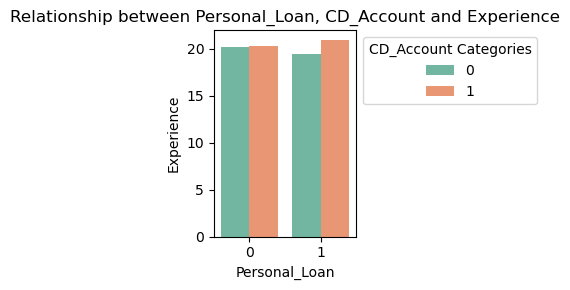

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

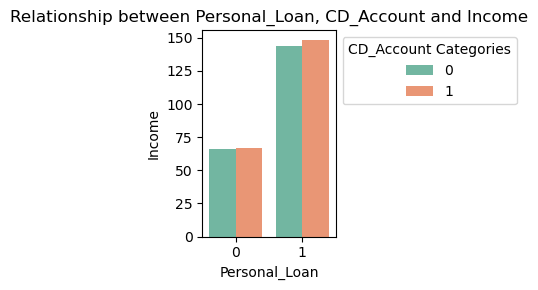

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

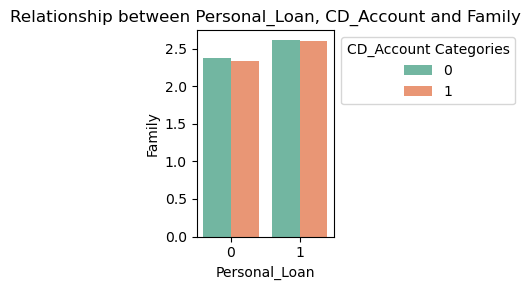

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

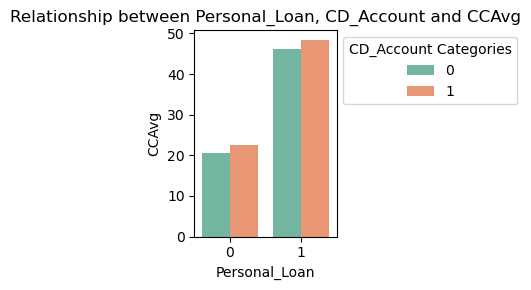

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

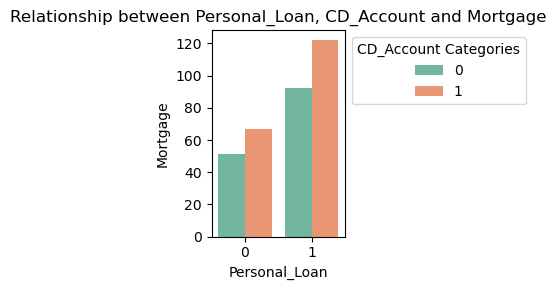

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

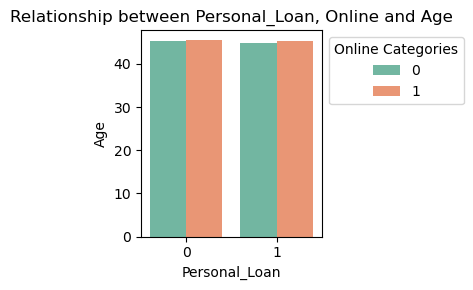

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

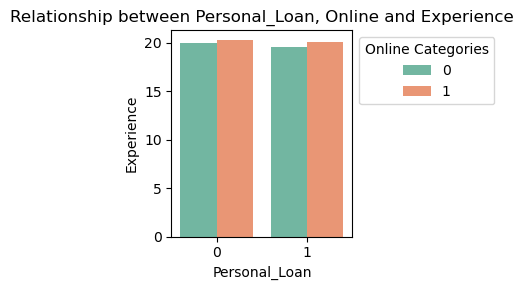

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

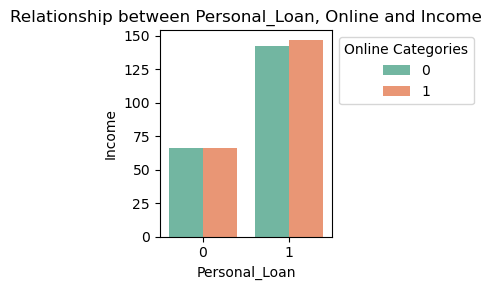

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

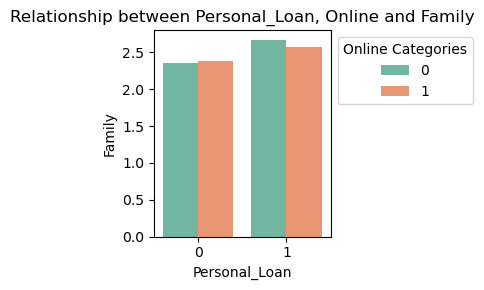

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

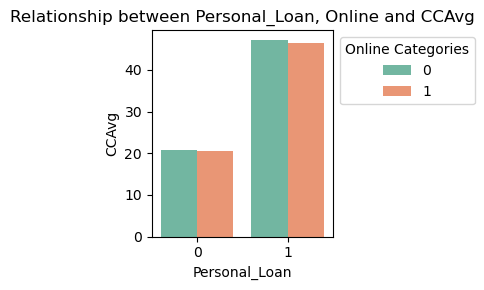

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

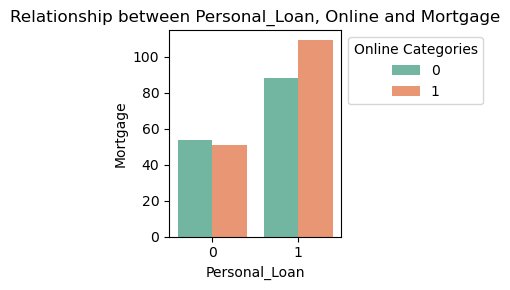

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

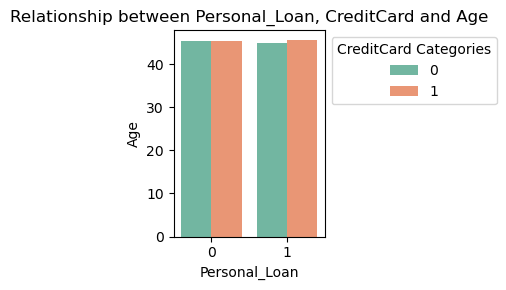

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

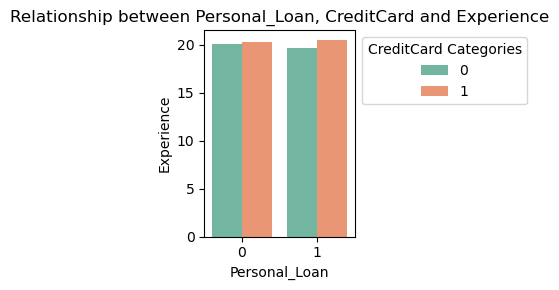

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

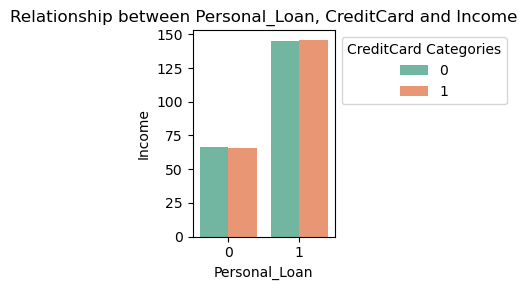

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

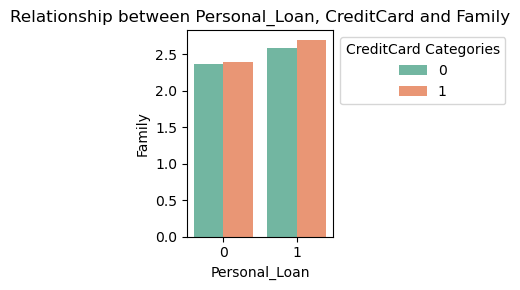

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

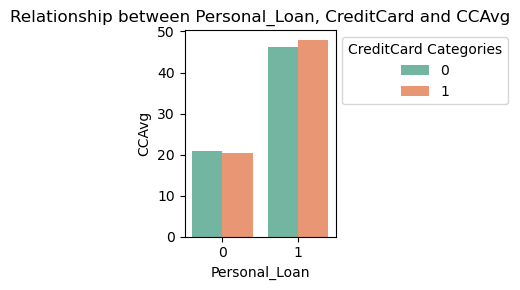

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

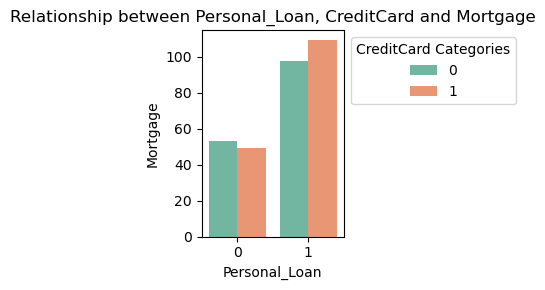

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

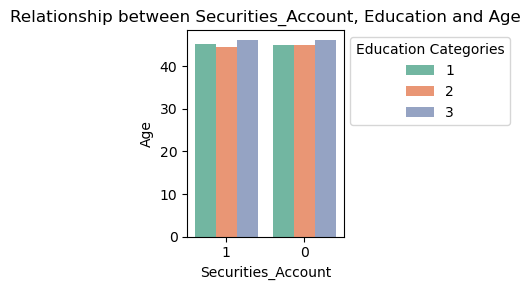

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

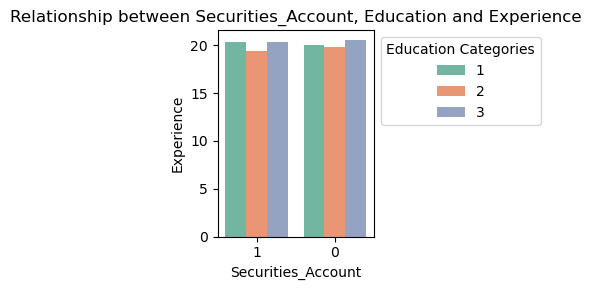

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

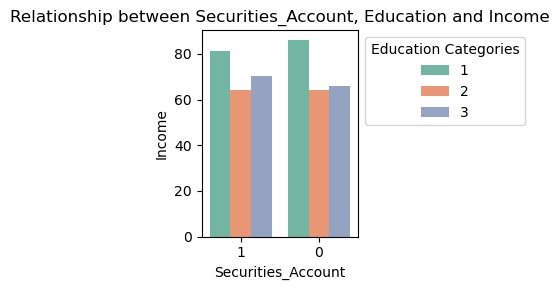

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

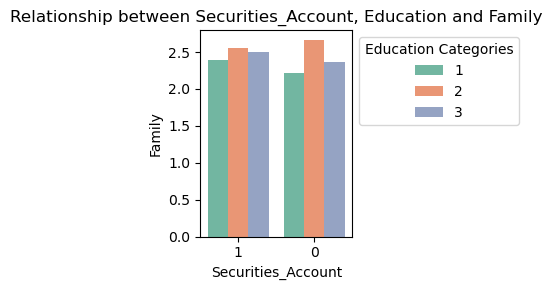

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

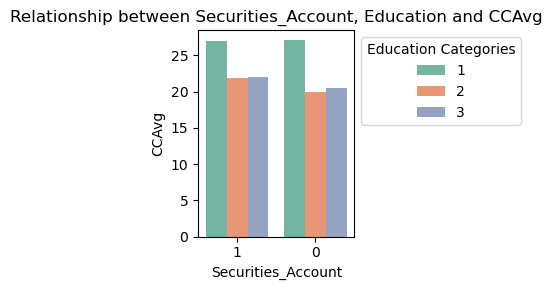

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

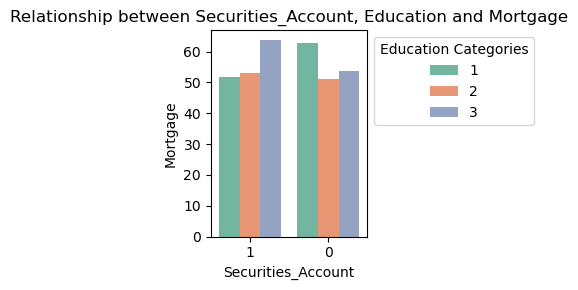

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

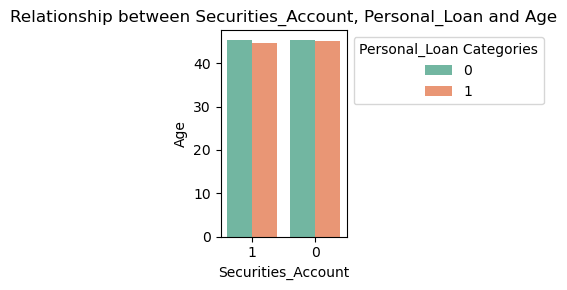

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

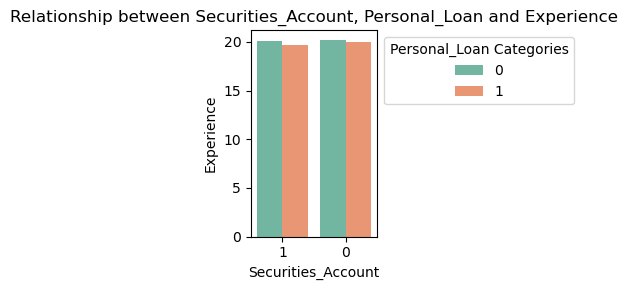

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

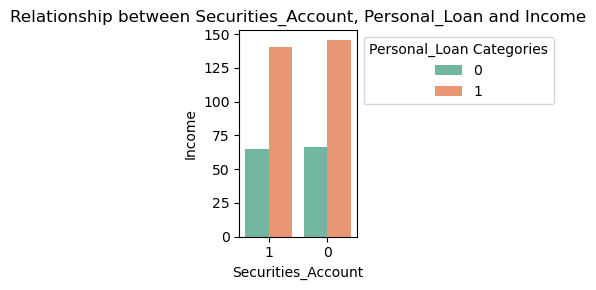

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

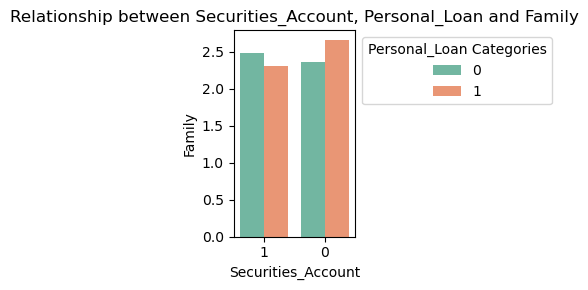

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

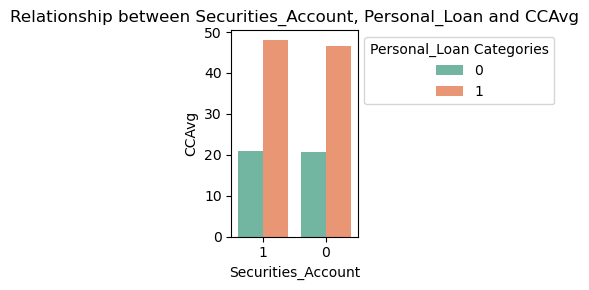

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

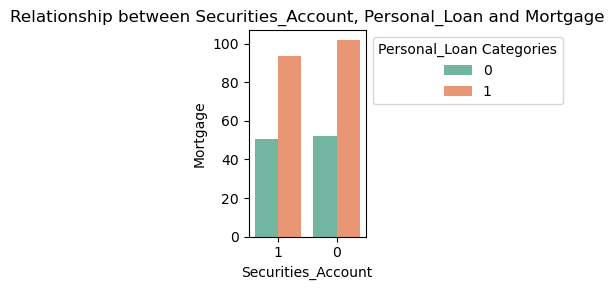

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

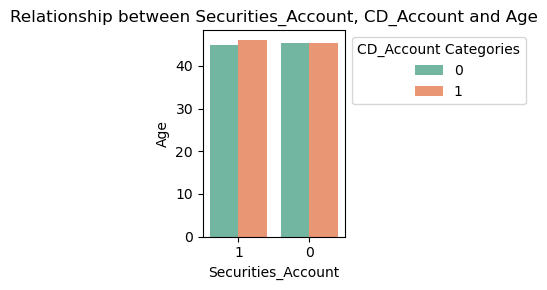

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

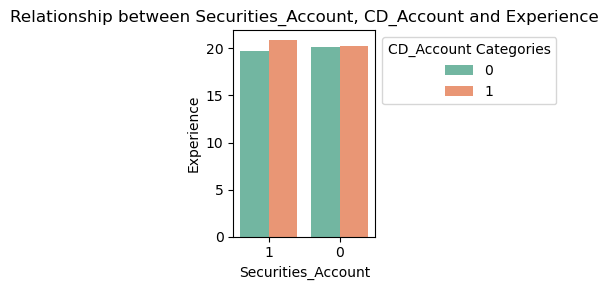

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

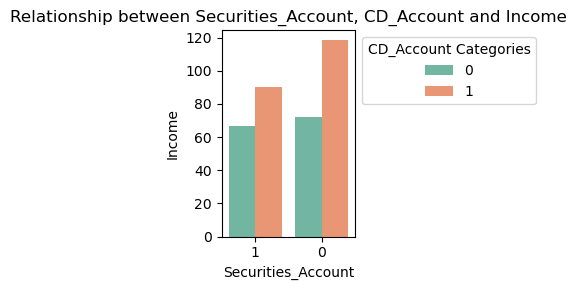

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

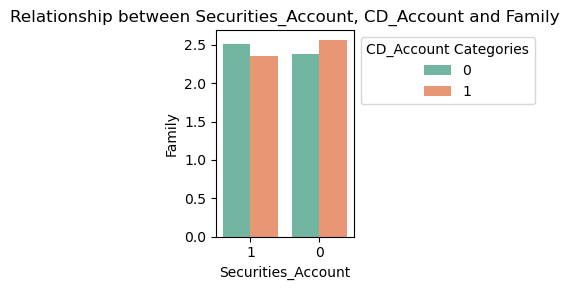

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

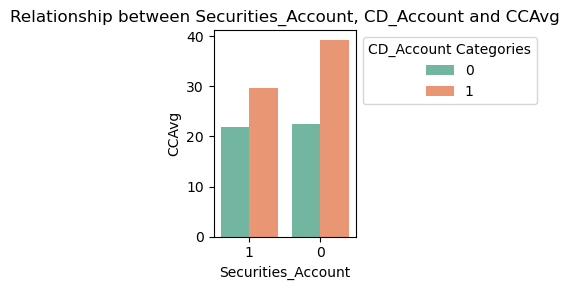

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

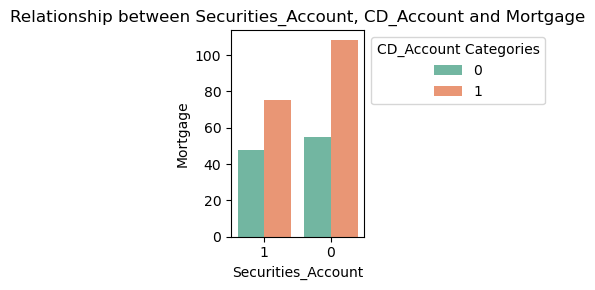

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

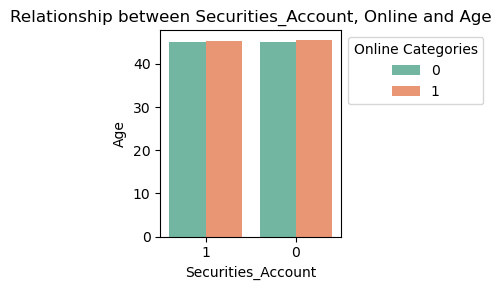

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

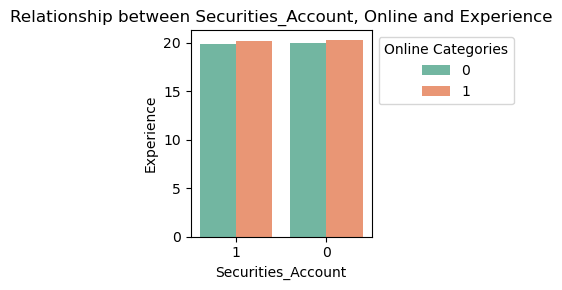

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

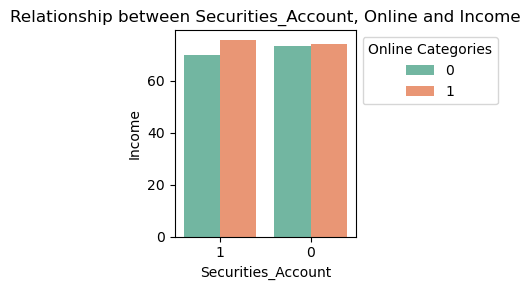

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

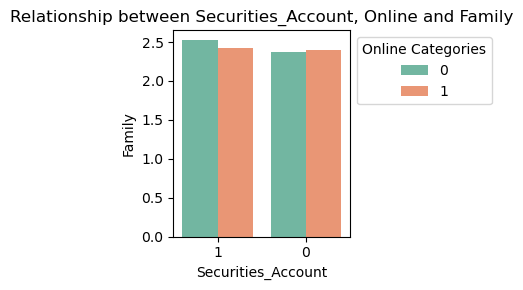

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

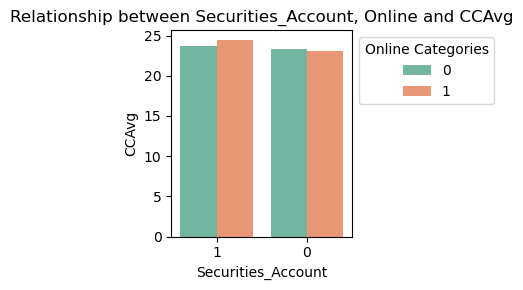

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

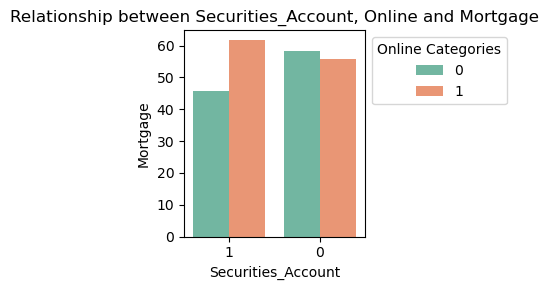

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

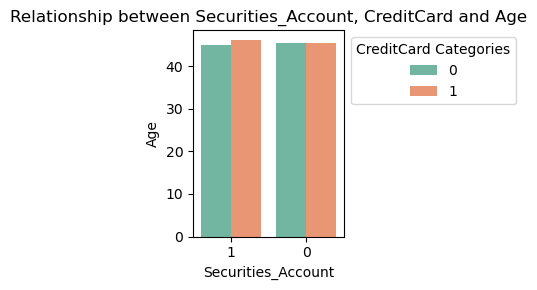

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

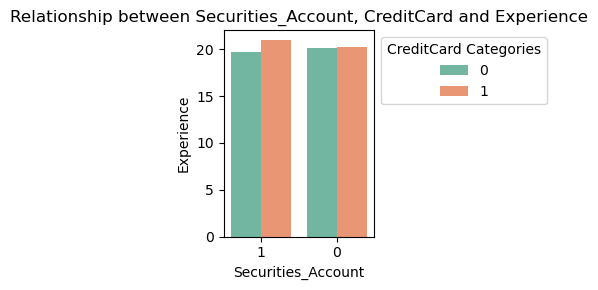

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

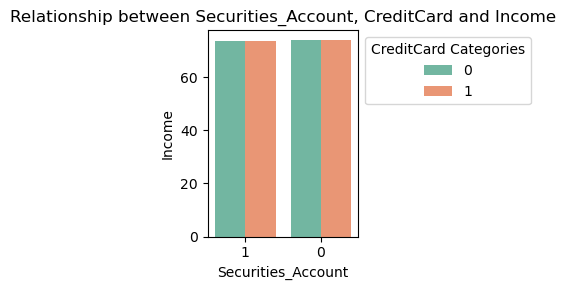

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

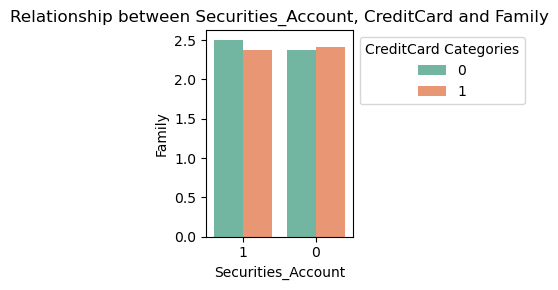

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

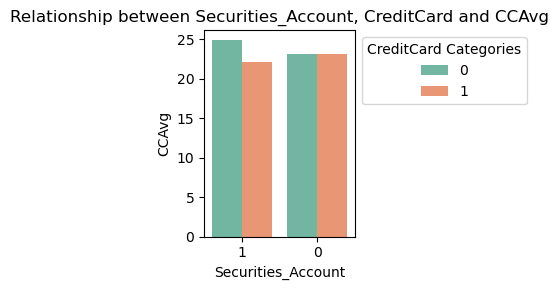

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

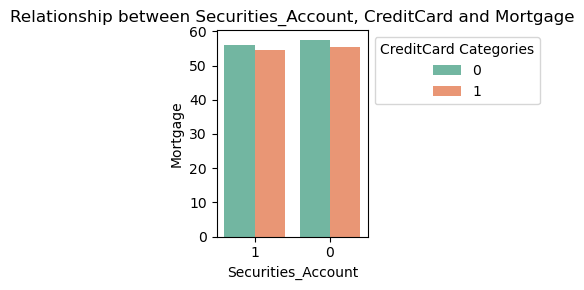

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

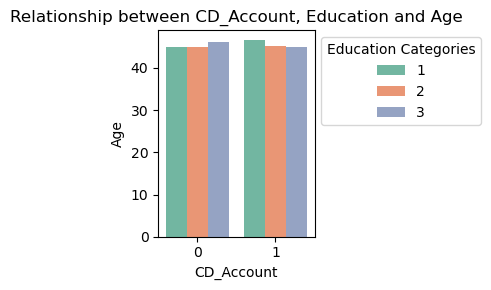

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

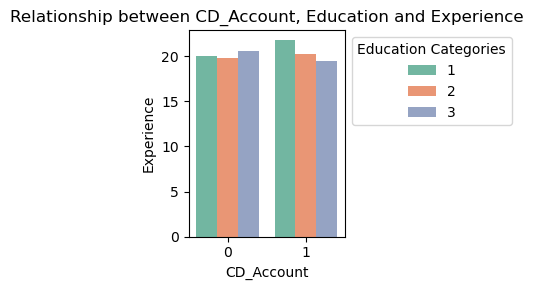

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

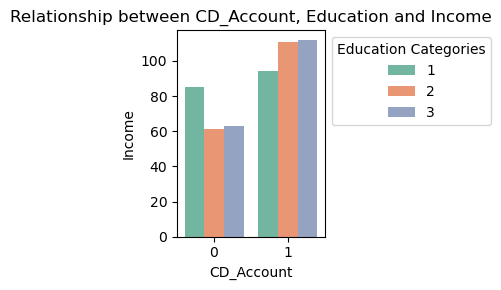

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

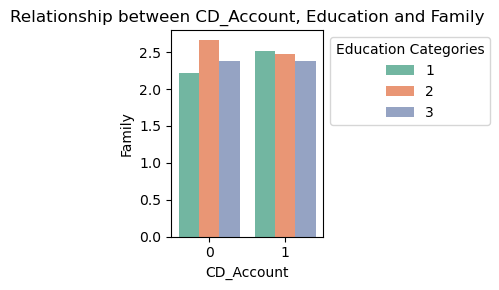

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

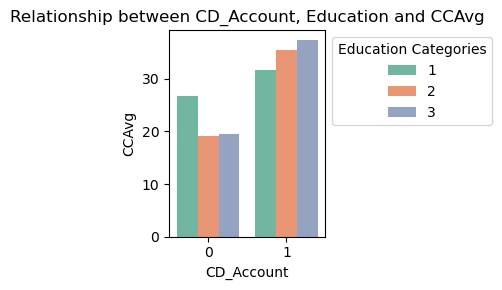

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

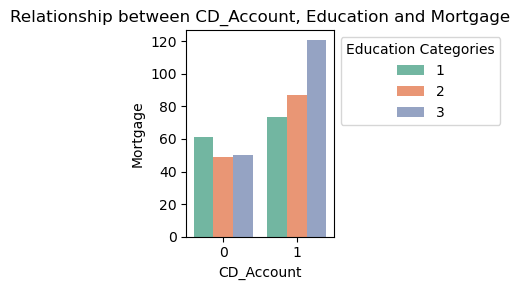

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

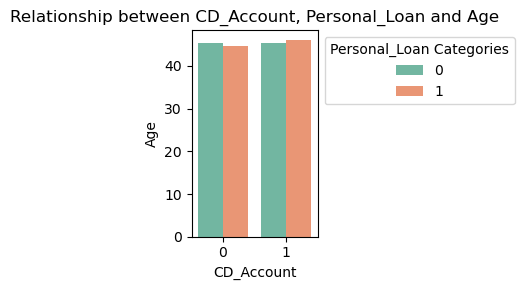

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

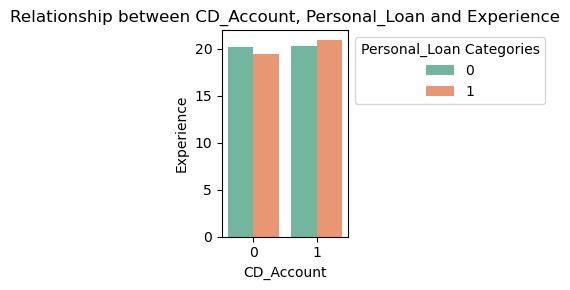

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

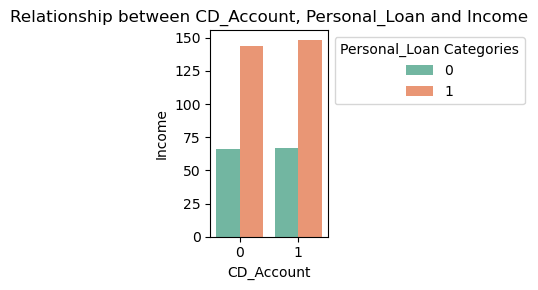

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

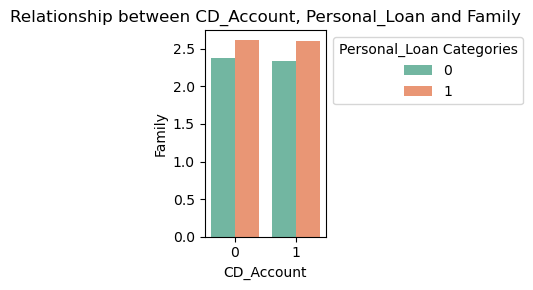

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

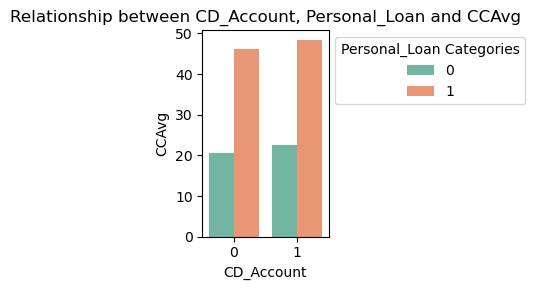

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

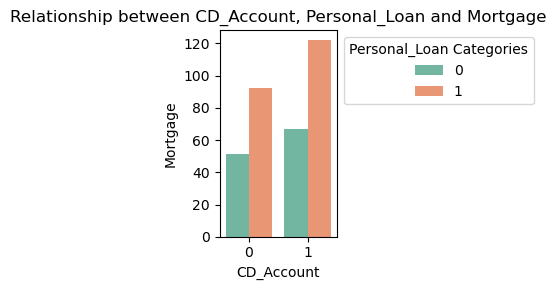

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

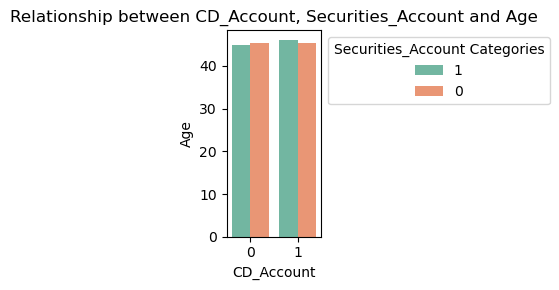

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

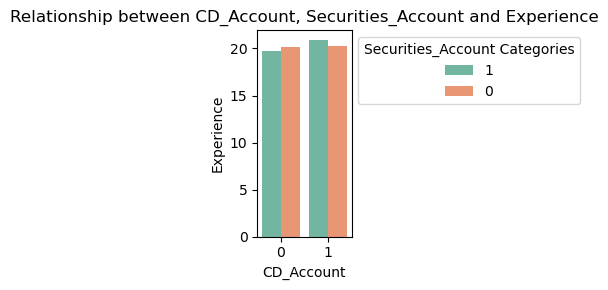

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

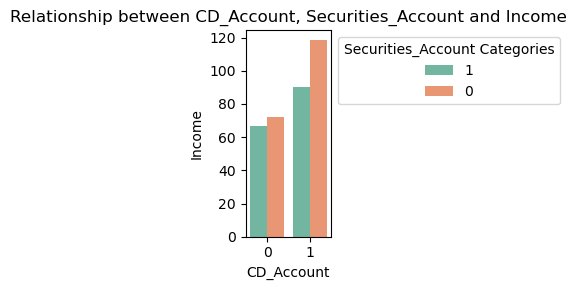

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

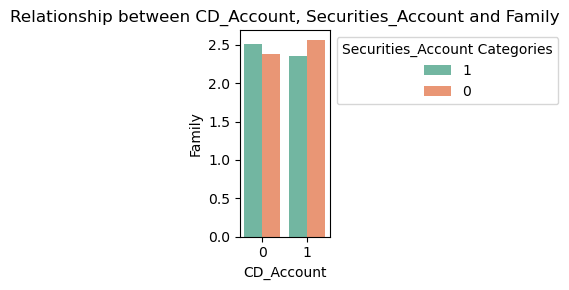

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

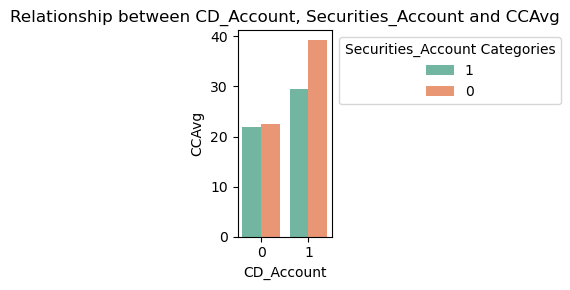

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

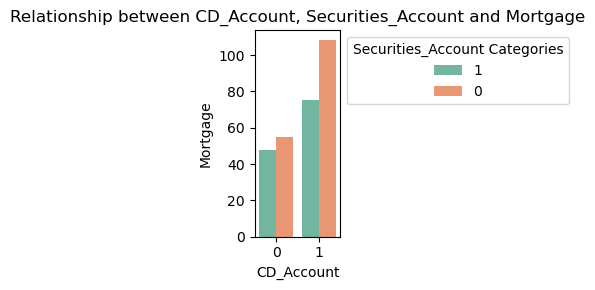

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

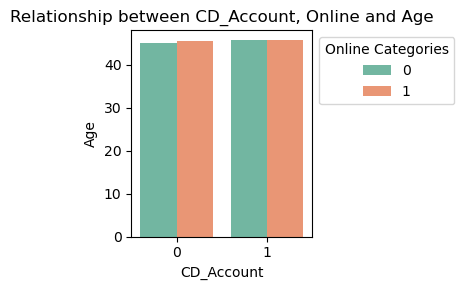

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

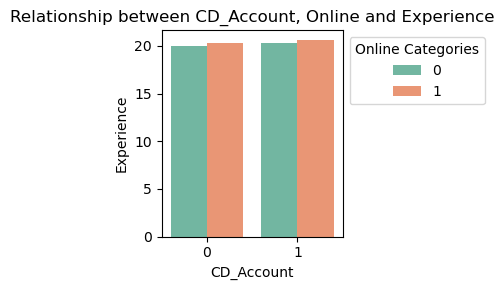

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

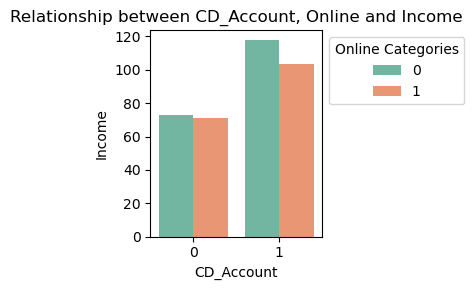

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

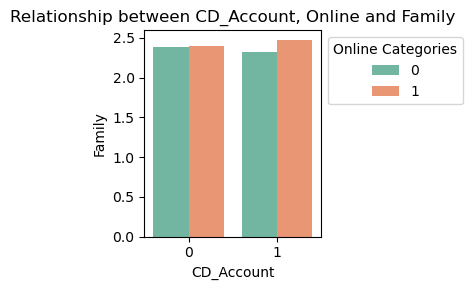

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

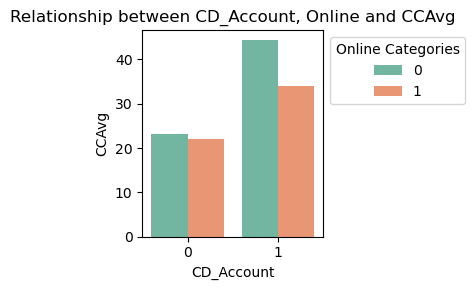

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

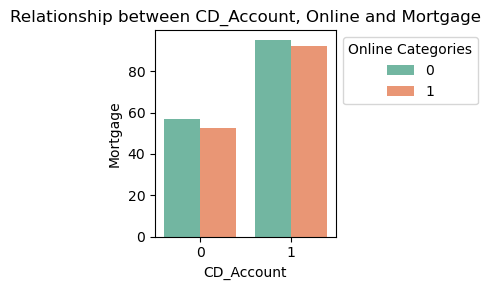

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

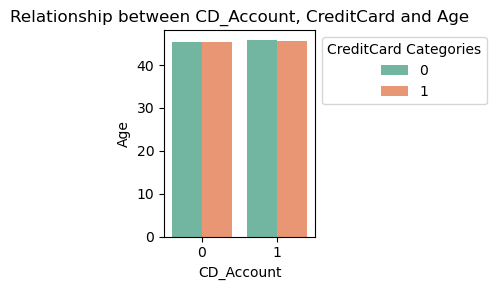

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

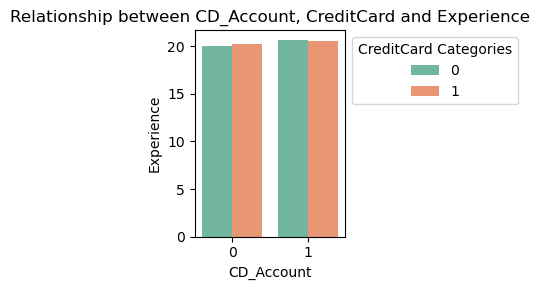

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

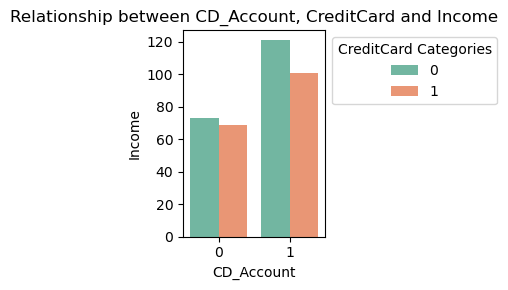

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

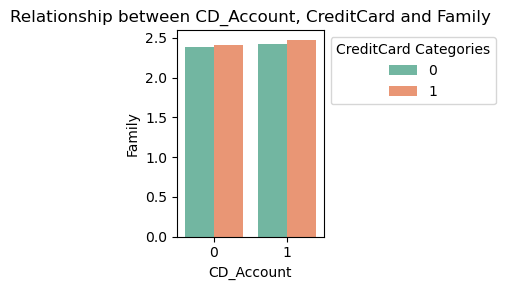

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

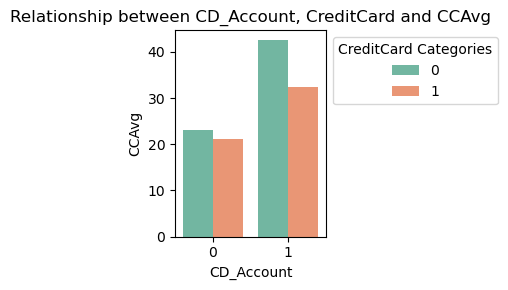

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

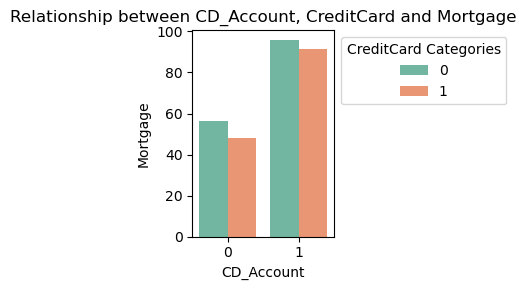

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

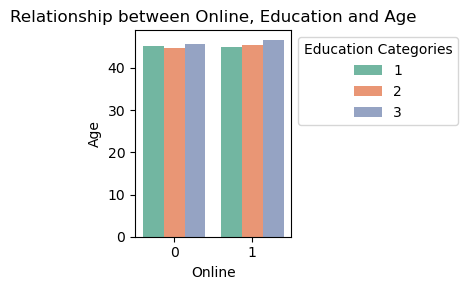

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

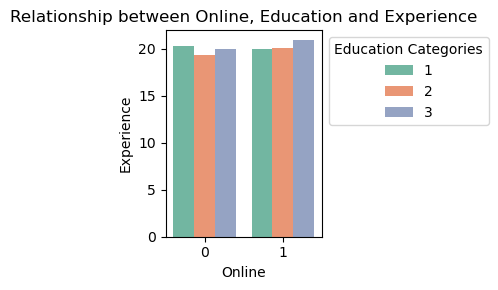

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

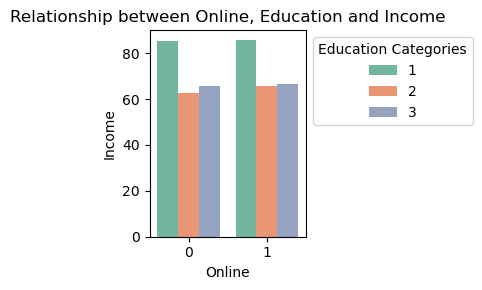

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

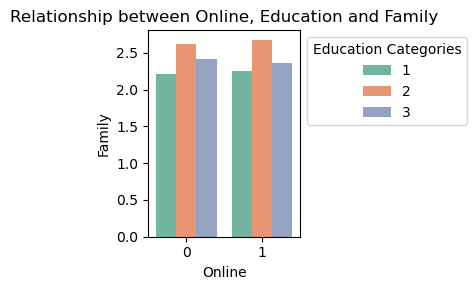

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

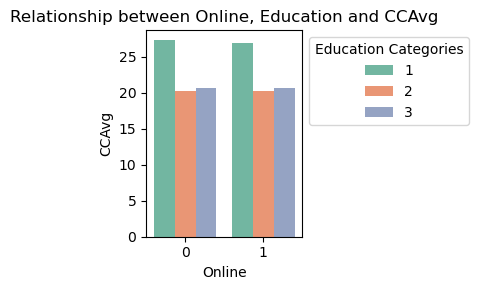

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

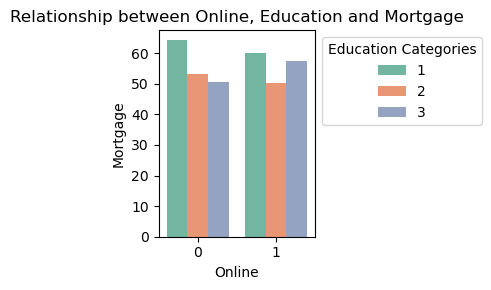

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

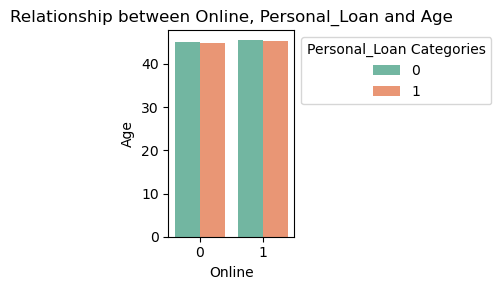

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

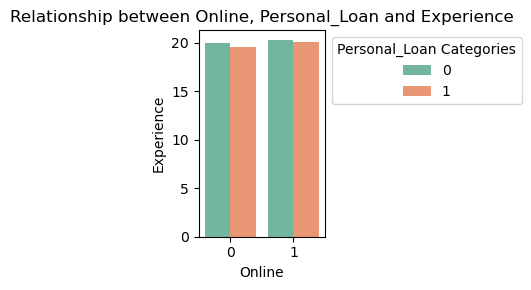

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

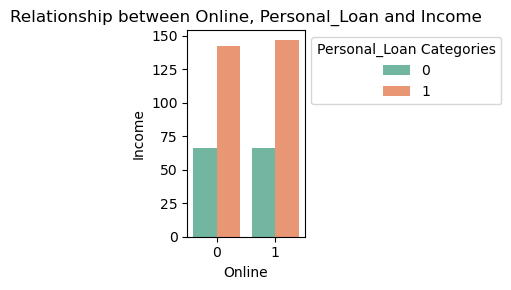

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

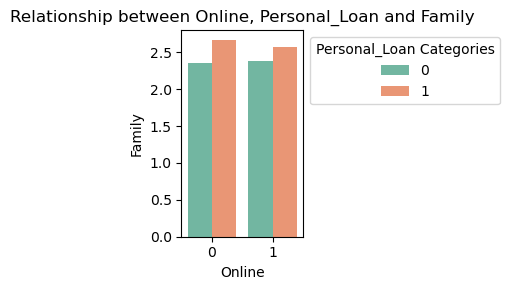

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

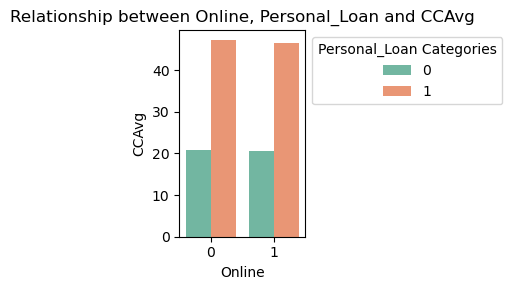

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

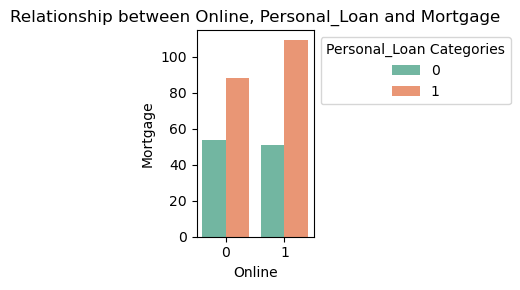

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

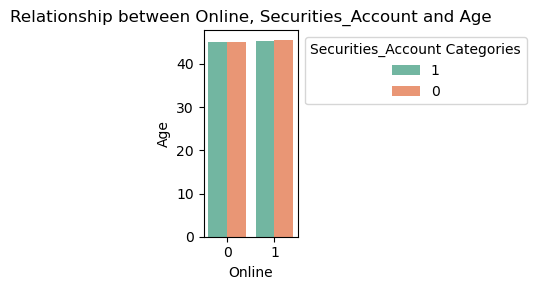

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

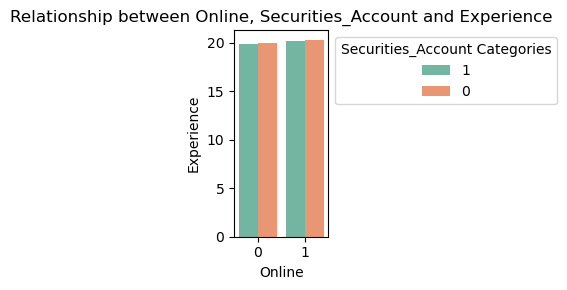

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

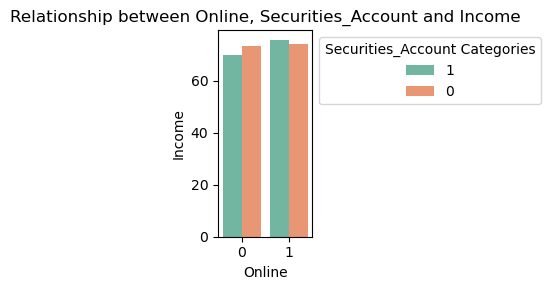

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

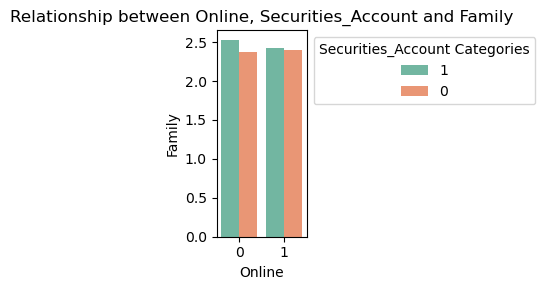

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

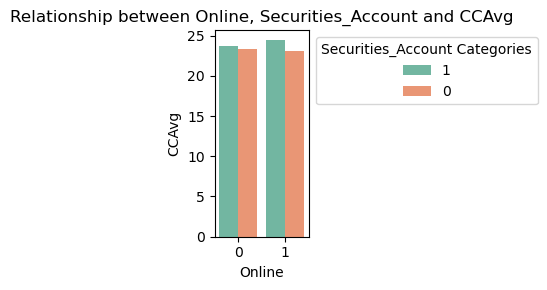

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

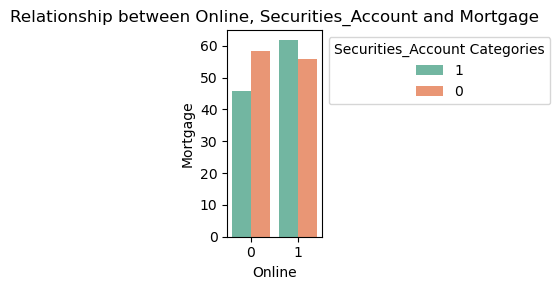

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

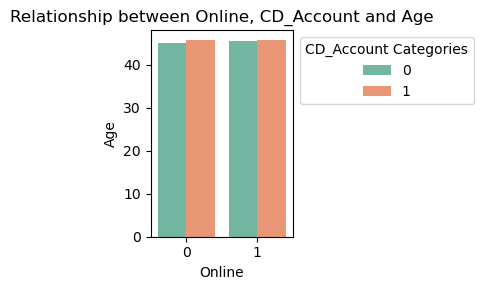

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

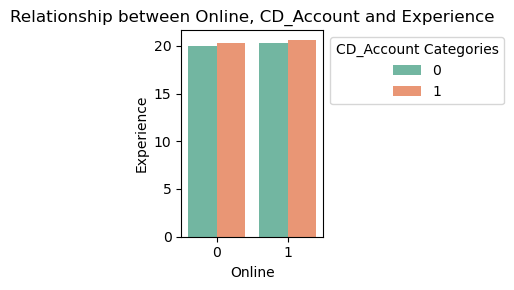

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

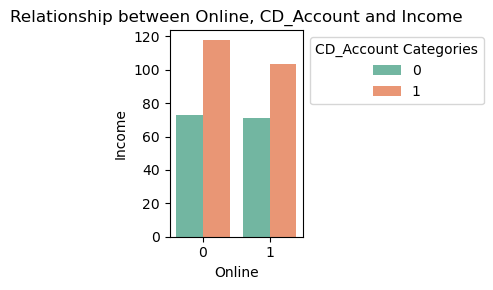

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

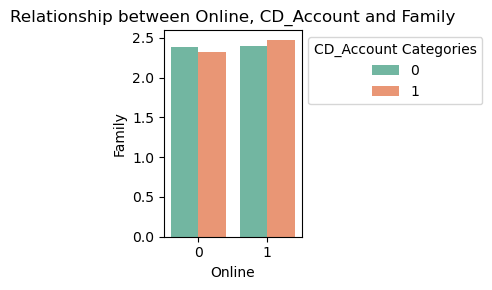

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

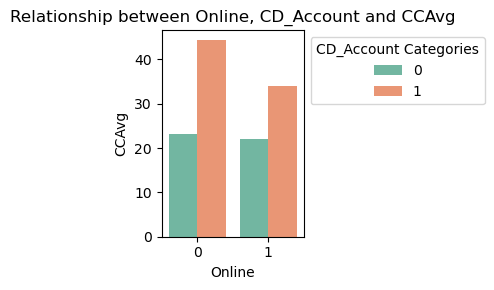

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

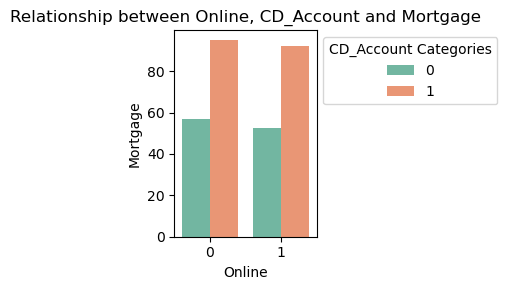

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

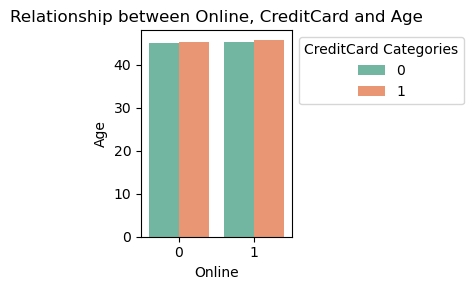

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

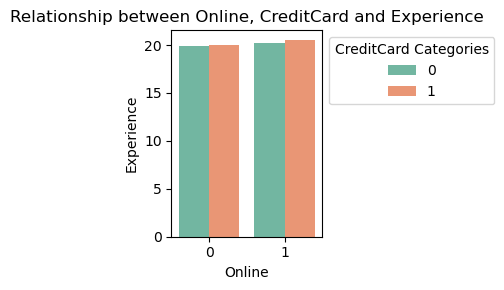

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

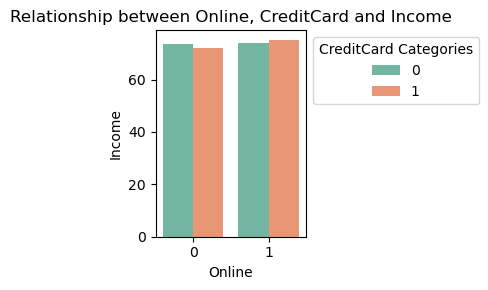

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

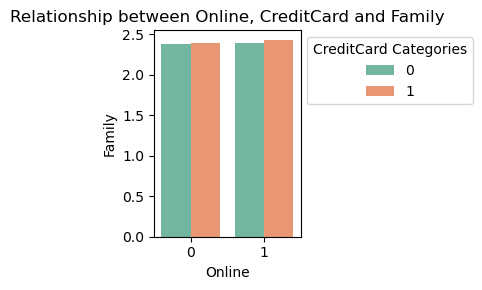

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

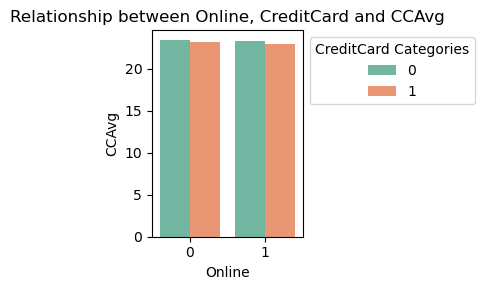

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

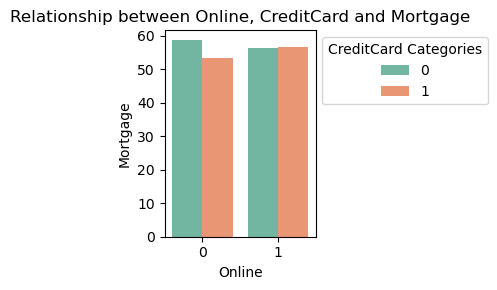

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

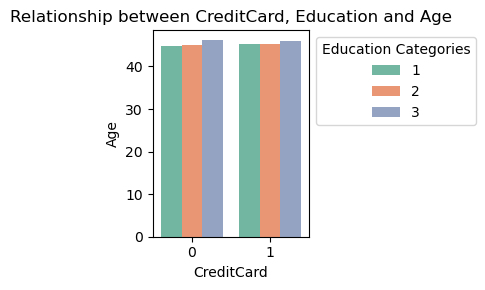

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

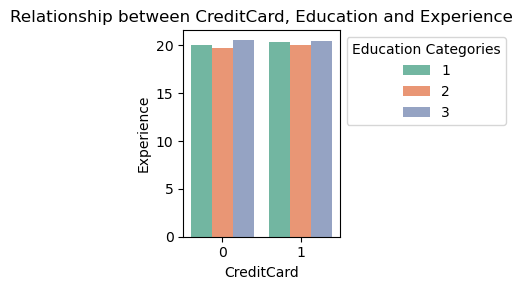

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

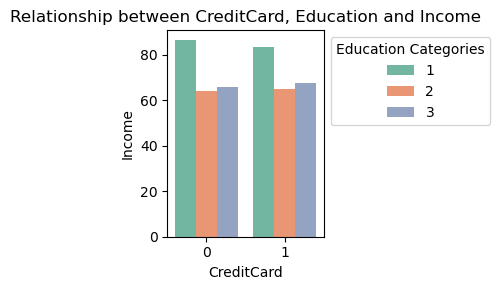

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

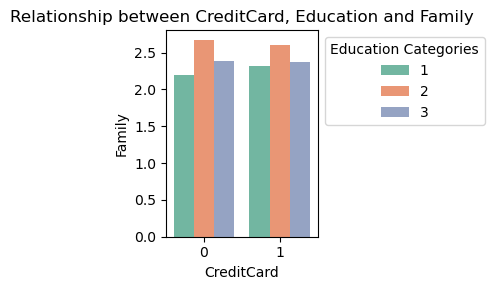

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

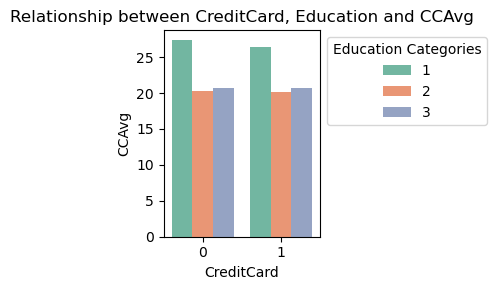

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

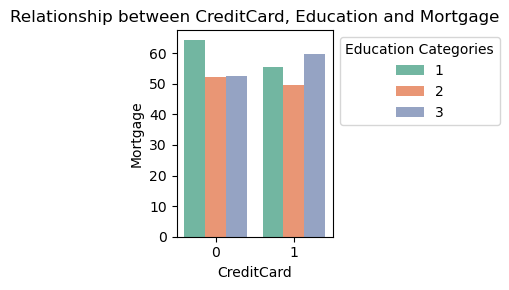

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

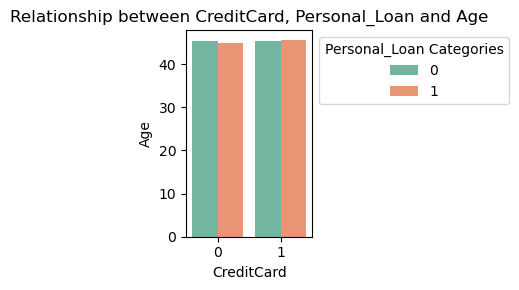

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

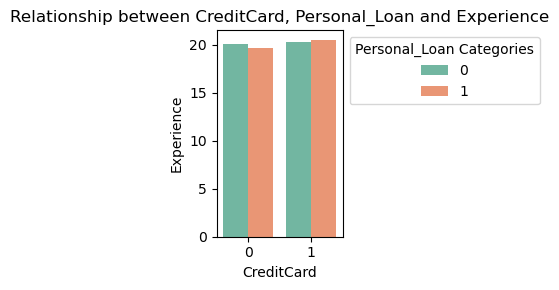

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

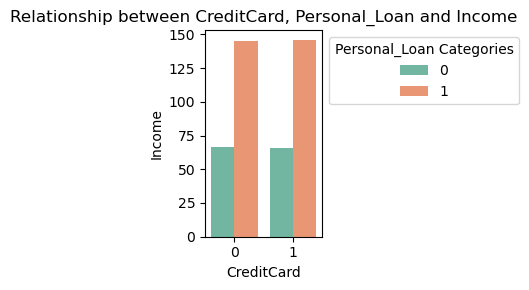

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

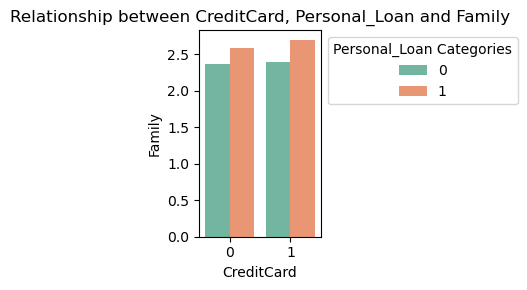

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

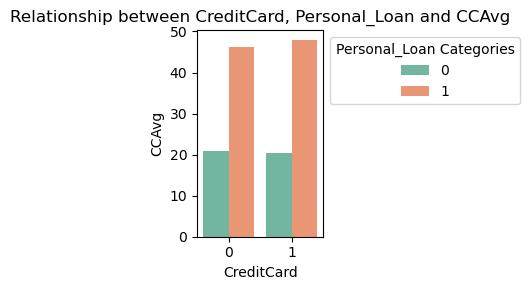

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

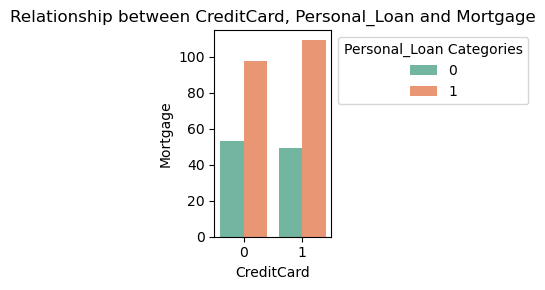

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

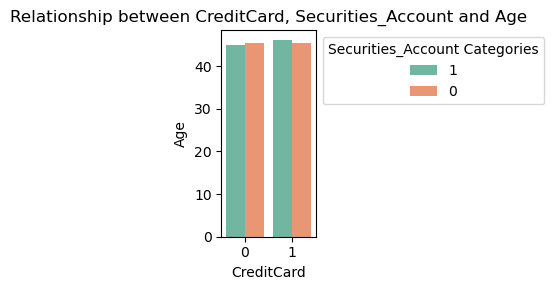

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

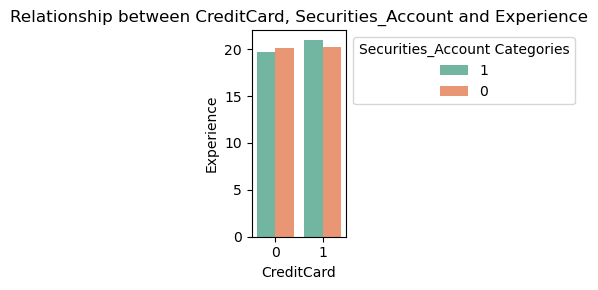

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

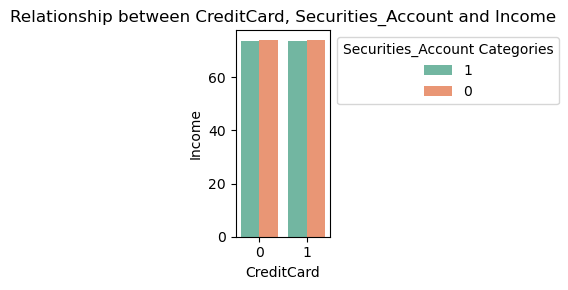

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

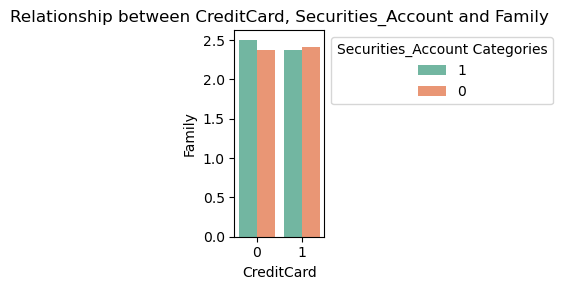

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

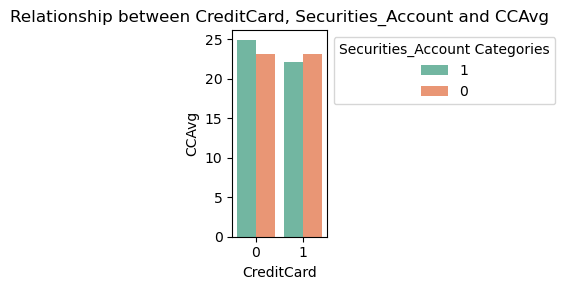

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

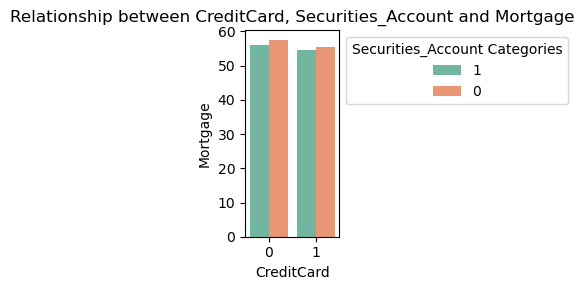

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

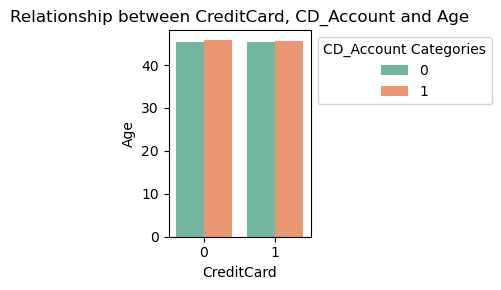

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

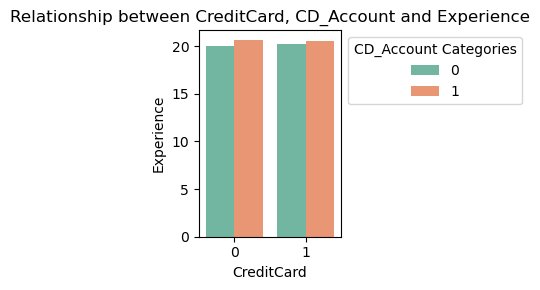

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

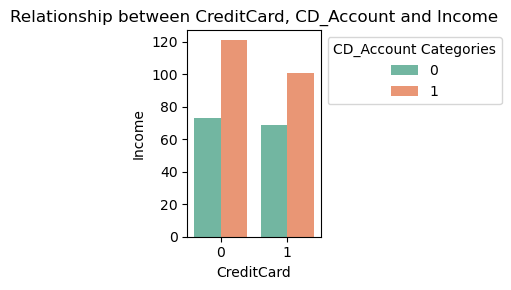

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

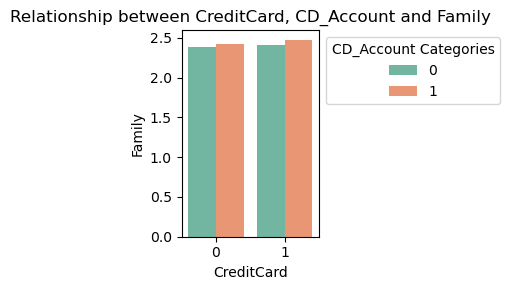

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

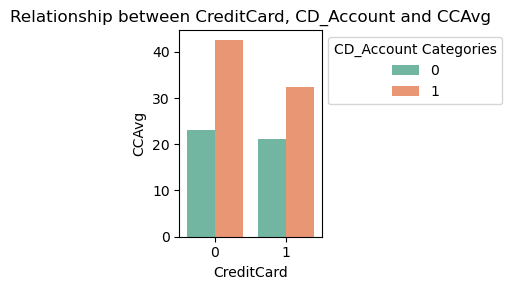

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

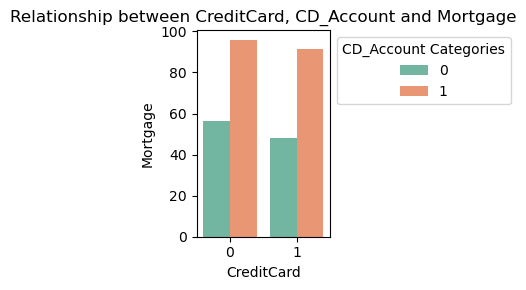

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

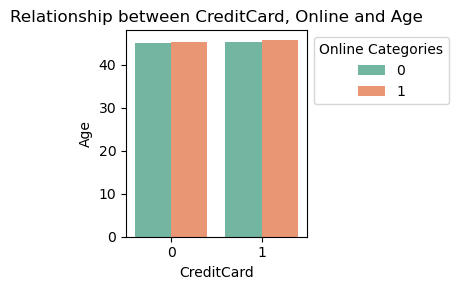

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

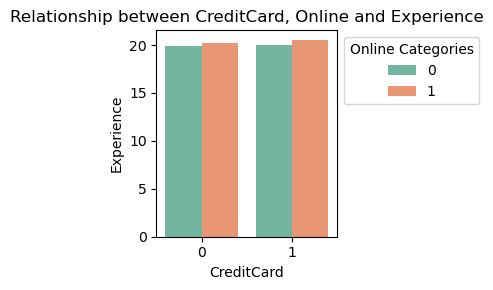

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

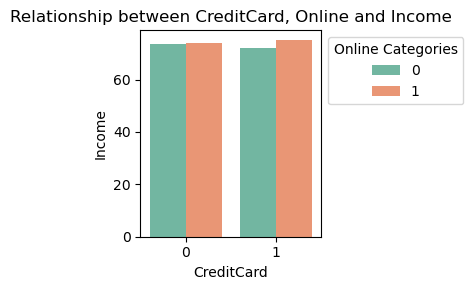

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

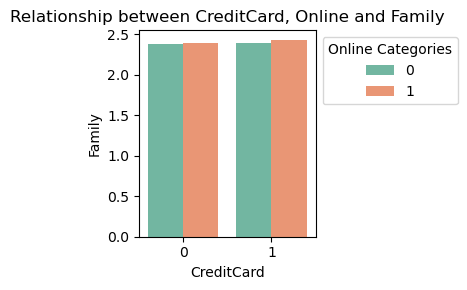

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

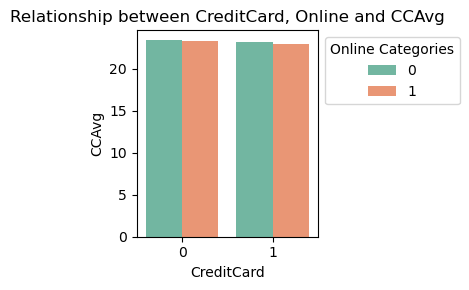

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

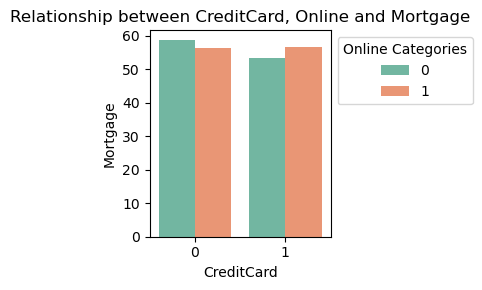

In [144]:
categorical_cols = ['Education', 'Personal_Loan', 'Securities_Account', 'CD_Account', 'Online', 'CreditCard']
numerical_cols = ['Age', 'Experience', 'Income', 'Family', 'CCAvg', 'Mortgage']

for cat1 in categorical_cols:
        for cat2 in categorical_cols:
            if cat1 != cat2:
                for num in numerical_cols:
                    # Bar plot for Categorical vs Categorical vs Numerical
                    plt.figure(figsize=(4,3))
                    sns.barplot(x=cat1, y=num, hue=cat2, data=df3, ci=None, palette='Set2')
                    plt.title(f'Relationship between {cat1}, {cat2} and {num}')
                    
                    # Add legend manually for hue
                    handles, labels = plt.gca().get_legend_handles_labels()
                    if handles:
                        plt.legend(handles, labels, title=f"{cat2} Categories", loc='upper left', bbox_to_anchor=(1, 1))

                    plt.tight_layout()
                    plt.show()

**MAJOR OBSERVATIONS FROM THE GRAPHS WITH RESPECT TO OUR TARGET VARIABLE:**

1) **AGE, EDUCATION AND PERSONAL LOAN:** The graph suggests that neither age nor education level seems to have a significant impact on whether a personal loan is taken.

2) **EXPERIENCE, EDUCATION AND PERSONAL LOAN:** Experience levels seem to be consistent irrespective of education and personal loan status. This suggests that there is no strong relationship between education level, experience, and the likelihood of taking a personal loan.

3) **INCOME, EDUCATION AND PERSONAL_LOAN:** Higher-income customers are more likely to take personal loans as seen from the graph.

4) **FAMILY, EDUCATION AND PERSONAL LOAN:** Customers with lower education levels and larger families may be more inclined to take personal loans.

5) **CCAvg, EDUCATION AND PERSONAL LOAN:** Customers with higher CCAvg are more likely to take personal loans regardless of education level.

6) **MORTGAGE, EDUCATION AND PERSONAL LOAN:** Customers with higher mortgages tend to avail the personal loan and the trend is similar across all education levels.

7) **PERSONAL LOAN, SECURITIES ACCOUNT AND AGE:** Neither age nor securities account ownership appears to differentiate between customers who take personal loans and those who do not.

8) **EXPERIENCE, PERSONAL LOAN AND SECURITIES ACCOUNT:** Neither years of experience nor securities account ownership seems to play a critical role in determining the possibility of availing personal loan by customers.

9) **PERSONAL LOAN, SECURITIES ACCOUNT AND INCOME:** Higher-income customers appear more likely to take personal loans, regardless of their securities account status.

10) **PERSONAL LOAN, SECURITIES ACCOUNT AND CCAVG:** Higher credit card spending (CCAvg) is associated with a higher likelihood of taking a personal loan, regardless of the ownership of securities account in the bank.

11) **PERSONAL LOAN, SECURITIES ACCOUNT AND MORTGAGE:** Customers with high mortgage value are associated with a higher likelihood of taking a personal loan, regardless of the ownership of securities account in the bank.

In [146]:
df3.shape

(4959, 20)

In [147]:
scores = pd.DataFrame({'Model':[],'Scores(accuracy)':[]})
def add_score(model_name, accuracy):
    global scores
    entry = pd.DataFrame({'Model': [model_name], 'Scores(accuracy)': [accuracy]})
    scores =  pd.concat([scores,entry], ignore_index=True)
    return scores

### **MODEL BUILDING FOR df3(dataset without removing outliers):**

In [148]:
df3.columns

Index(['ID', 'Age', 'Experience', 'Income', 'ZIP_Code', 'Family', 'CCAvg',
       'Education', 'Mortgage', 'Personal_Loan', 'Securities_Account',
       'CD_Account', 'Online', 'CreditCard', 'decade', 'place_name',
       'county_name', 'county_code', 'latitude', 'longitude'],
      dtype='object')

In [149]:
x=df3.drop(['ID','Personal_Loan','decade'],axis=1)

In [150]:
x

,Age,Experience,Income,ZIP_Code,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard,place_name,county_name,county_code,latitude,longitude
0,25,1,49,91107,4,19.2,1,0,1,0,0,0,Pasadena,Los Angeles,37.0,34.1510,-118.0889
1,45,19,34,90089,3,18.0,1,0,1,0,0,0,Los Angeles,Los Angeles,37.0,33.7866,-118.2987
2,39,15,11,94720,1,12.0,1,0,0,0,0,0,Berkeley,Alameda,1.0,37.8738,-122.2549
3,35,9,100,94112,1,32.4,2,0,0,0,0,0,San Francisco,City and County of San Francisco,75.0,37.7195,-122.4411
4,35,8,45,91330,4,12.0,2,0,0,0,0,1,Northridge,Los Angeles,37.0,34.2283,-118.5368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,29,3,40,92697,1,22.8,3,0,0,0,1,0,Irvine,Orange,59.0,33.6485,-117.8387
4996,30,4,15,92037,4,4.8,1,85,0,0,1,0,La Jolla,San Diego,73.0,32.8455,-117.2521
4997,63,39,24,93023,2,3.6,3,0,0,0,0,0,Ojai,Ventura,111.0,34.4451,-119.2565
4998,65,40,49,90034,3,6.0,2,0,0,0,1,0,Los Angeles,Los Angeles,37.0,34.0290,-118.4005


In [151]:
y=df3.Personal_Loan.values

In [152]:
y

array(['0', '0', '0', ..., '0', '0', '0'], dtype=object)

In [153]:
x = x.drop(['place_name', 'county_name'], axis=1)

In [154]:
x.dtypes

Age                     int64
Experience              int64
Income                  int64
ZIP_Code                int64
Family                  int64
CCAvg                 float64
Education              object
Mortgage                int64
Securities_Account     object
CD_Account             object
Online                 object
CreditCard             object
county_code           float64
latitude              float64
longitude             float64
dtype: object

In [155]:
x.isnull().sum()

Age                   0
Experience            0
Income                0
ZIP_Code              0
Family                0
CCAvg                 0
Education             0
Mortgage              0
Securities_Account    0
CD_Account            0
Online                0
CreditCard            0
county_code           0
latitude              0
longitude             0
dtype: int64

### **TRAIN AND TEST SPLIT:**

In [156]:
from sklearn.model_selection import train_test_split

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.40)

In [157]:
len(x_train)

2975

In [158]:
len(x_test)

1984

In [159]:
len(y_train)

2975

In [160]:
len(y_test)

1984

#### **FEATURE SCALING:**

In [161]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x_train_sc=sc.fit_transform(x_train)
x_test_sc=sc.transform(x_test)


In [162]:
len(x_train_sc)

2975

In [163]:
len(x_test_sc)

1984

### **DECISION TREE:**

In [164]:
from sklearn.tree import DecisionTreeClassifier

In [165]:
#Initiate the classifier
model_DT=DecisionTreeClassifier()

In [166]:
#Passing the data to the classifier
model_DT.fit(x_train_sc,y_train)

DecisionTreeClassifier()

In [167]:
y_pred_DT=model_DT.predict(x_test_sc)

In [168]:
from sklearn.metrics import accuracy_score

print(round(accuracy_score(y_test,y_pred_DT)*100,2))

97.98


In [169]:
from sklearn.metrics import confusion_matrix
print(confusion_matrix(y_test,y_pred_DT))

[[1770   20]
 [  20  174]]


In [170]:
from sklearn.metrics import classification_report
print(classification_report(y_test,y_pred_DT))

              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1790
           1       0.90      0.90      0.90       194

    accuracy                           0.98      1984
   macro avg       0.94      0.94      0.94      1984
weighted avg       0.98      0.98      0.98      1984



In [171]:
add_score('DecisionTree',accuracy_score(y_test,y_pred_DT))

,Model,Scores(accuracy)
0,DecisionTree,0.979839


### **RANDOM FOREST:**

In [172]:
from sklearn.ensemble import RandomForestClassifier

In [173]:
#Initiate the classifier
model_RF=RandomForestClassifier()

In [174]:
#Passing the data to the classifier
model_RF.fit(x_train_sc,y_train)

RandomForestClassifier()

In [175]:
y_pred_RF=model_RF.predict(x_test_sc)

In [176]:
print(round(accuracy_score(y_test,y_pred_RF)*100,2))

98.24


In [177]:
print(confusion_matrix(y_test,y_pred_RF))

[[1784    6]
 [  29  165]]


In [178]:
print(classification_report(y_test,y_pred_RF))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99      1790
           1       0.96      0.85      0.90       194

    accuracy                           0.98      1984
   macro avg       0.97      0.92      0.95      1984
weighted avg       0.98      0.98      0.98      1984



In [179]:
add_score('RandomForestClassifier',accuracy_score(y_test,y_pred_RF))

,Model,Scores(accuracy)
0,DecisionTree,0.979839
1,RandomForestClassifier,0.982359


### **KNN:**

In [180]:
from sklearn.neighbors import KNeighborsClassifier

In [181]:
#Initiate the classifier
model_knn=KNeighborsClassifier()

In [182]:
#Passing the data to the classifier
model_knn.fit(x_train_sc,y_train)

KNeighborsClassifier()

In [183]:
y_pred_knn=model_knn.predict(x_test_sc)

In [184]:
print(round(accuracy_score(y_test,y_pred_knn)*100,2))

94.1


In [185]:
print(confusion_matrix(y_test,y_pred_knn))

[[1774   16]
 [ 101   93]]


In [186]:
print(classification_report(y_test,y_pred_knn))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97      1790
           1       0.85      0.48      0.61       194

    accuracy                           0.94      1984
   macro avg       0.90      0.74      0.79      1984
weighted avg       0.94      0.94      0.93      1984



In [187]:
add_score('KNN',accuracy_score(y_test,y_pred_knn))

,Model,Scores(accuracy)
0,DecisionTree,0.979839
1,RandomForestClassifier,0.982359
2,KNN,0.941028


### **NAIVE-BAYES:**

In [188]:
from sklearn.naive_bayes import GaussianNB

In [189]:
#Initiate the classifier
model_NB=GaussianNB()

In [190]:
model_NB.fit(x_train_sc,y_train)

GaussianNB()

In [191]:
y_pred_NB=model_NB.predict(x_test_sc)

In [192]:
print(round(accuracy_score(y_test,y_pred_NB)*100,2))

89.21


In [193]:
print(confusion_matrix(y_test,y_pred_NB))

[[1662  128]
 [  86  108]]


In [194]:
print(classification_report(y_test,y_pred_NB))

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      1790
           1       0.46      0.56      0.50       194

    accuracy                           0.89      1984
   macro avg       0.70      0.74      0.72      1984
weighted avg       0.90      0.89      0.90      1984



In [195]:
add_score('NAIVE-BAYES',accuracy_score(y_test,y_pred_NB))

,Model,Scores(accuracy)
0,DecisionTree,0.979839
1,RandomForestClassifier,0.982359
2,KNN,0.941028
3,NAIVE-BAYES,0.892137


### **SVC:**

In [196]:
from sklearn.svm import SVC

In [197]:
#initiating the classifier
model_SVC=SVC()

In [198]:
model_SVC.fit(x_train_sc,y_train)

SVC()

In [199]:
y_pred_SVC=model_SVC.predict(x_test_sc)

In [200]:
print(round(accuracy_score(y_test,y_pred_SVC)*100,2))

96.42


In [201]:
print(confusion_matrix(y_test,y_pred_SVC))

[[1780   10]
 [  61  133]]


In [202]:
print(classification_report(y_test,y_pred_SVC))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1790
           1       0.93      0.69      0.79       194

    accuracy                           0.96      1984
   macro avg       0.95      0.84      0.88      1984
weighted avg       0.96      0.96      0.96      1984



In [203]:
add_score('SVC',accuracy_score(y_test,y_pred_SVC))

,Model,Scores(accuracy)
0,DecisionTree,0.979839
1,RandomForestClassifier,0.982359
2,KNN,0.941028
3,NAIVE-BAYES,0.892137
4,SVC,0.964214


## **Among all the models that I have used, RandomForestClassifier works the finest. So we are going ahead with RandomForestClassifier for testing our model on data of a customer** 

In [204]:
X=pd.DataFrame(df3, columns=["Age","Experience", "Income", "Family", "CCAvg" ,"Education", "Mortgage", "Securities_Account", "CD_Account","Online", "CreditCard","latitude","longitude"])
Y=df3["Personal_Loan"].values.reshape(-1,1)

In [219]:
predict_df = pd.DataFrame({'Age':[29],
                          'Experience':[5],
                          'Income':[135],
                          'Family':[3],
                          'CCAvg':[63.60],
                          'Education':[1],
                          'Mortgage':[0],
                          'Securities_Account':[0],
                          'CD_Account':[1],
                          'Online':[1],
                          'CreditCard':[1],
                          "latitude":[37.7195],
                          "longitude":[-122.4411]})


predict_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard,latitude,longitude
0,29,5,135,3,63.6,1,0,0,1,1,1,37.7195,-122.4411


In [207]:
model_RF.fit(X,Y)

RandomForestClassifier()

In [220]:
result1=model_RF.predict(predict_df)

In [221]:
result1

array(['1'], dtype=object)

In [210]:
predict_df = pd.DataFrame({'Age':[42],
                          'Experience':[16],
                          'Income':[30],
                          'Family':[3],
                          'CCAvg':[14.4],
                          'Education':[3],
                          'Mortgage':[0],
                          'Securities_Account':[1],
                          'CD_Account':[0],
                          'Online':[1],
                          'CreditCard':[1],
                          "latitude":[37.7195],
                          "longitude":[-122.4411]})


predict_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard,latitude,longitude
0,42,16,30,3,14.4,3,0,1,0,1,1,37.7195,-122.4411


In [211]:
result2=model_RF.predict(predict_df)

In [212]:
result2

array(['0'], dtype=object)

In [216]:
predict_df = pd.DataFrame({'Age':[51],
                          'Experience':[26],
                          'Income':[72],
                          'Family':[1],
                          'CCAvg':[34.80],
                          'Education':[1],
                          'Mortgage':[0],
                          'Securities_Account':[0],
                          'CD_Account':[0],
                          'Online':[0],
                          'CreditCard':[0],
                          "latitude":[37.7195],
                          "longitude":[-122.4411]})


predict_df

,Age,Experience,Income,Family,CCAvg,Education,Mortgage,Securities_Account,CD_Account,Online,CreditCard,latitude,longitude
0,51,26,72,1,34.8,1,0,0,0,0,0,37.7195,-122.4411


In [217]:
result3=model_RF.predict(predict_df)

In [218]:
result3

array(['0'], dtype=object)